## Case Study Submission by Saptarshi Ghosh and Nitin Balaji Srinivasan, Cohort 58 - AI and ML

## Telecom Churn Group Case Study

#### Problem Statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from 
one operator to another. In this highly competitive market, the telecommunications industry experiences 
an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than 
to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal. 

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. 
In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify 
customers at high risk of churn, and identify the main indicators of churn.

Customer behaviour during churn:

Customers usually do not decide to switch to another competitor instantly, but rather over a period of time 
(this is especially applicable to high-value customers). 
In churn prediction, we assume that there are three phases of customer lifecycle :

1) The ‘good’ phase: In this phase, the customer is happy with the service and behaves as usual.

2) The ‘action’ phase: The customer experience starts to sore in this phase, for 
    e.g. he/she gets a compelling offer from a competitor, faces unjust charges, 
    becomes unhappy with service quality etc. 
    In this phase, the customer usually shows different behaviour than the ‘good’ months. 
    It is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken 
    at this point (such as matching the competitor’s offer/improving the service quality etc.)

3) The ‘churn’ phase: In this phase, the customer is said to have churned. 
    In this case, since you are working over a four-month window, the first month (June) is the ‘good’ phase, 
    the second month (July) is the ‘action’ phase, while the third month (August) is the ‘churn’ phase.

#### Objective:

The main goal of the case study is to build ML models to predict churning customers based on the features provided 
for their usage. 

1) The model will be used to predict whether a high-value customer will churn or not, in near future (i.e. churn phase). 
By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.

2) It will be used to identify important variables that are strong predictors of churn. These variables may also indicate 
why customers choose to switch to other networks.

We will use overall accuracy as primary evaluation metric, however we would also calculate other metrics like precision, 
recall, etc. for the different models that can be used for evaluation purposes based on different business objectives. 


One of the key objectives of this ML model is to identify customers who will definitely churn with more accuracy 
as compared to the ones who will not churn. Therefore we will focus on 'Sensitivity' as a key metric 
throughout the comparison of all models

#### Approach:

PCA will be used for dimensionality reduction to predict churning customers but this will not help with 
interpration of the important variables of churn.

Therefore we will build  two models to address the objectives 1) and 2) separately. 

### Steps:
- Data Understanding
- Data Cleansing (Missing data imputation)
- EDA (Univariate--->Bivariate--->Heatmaps)
- Feature Engineering
- Feature Selection (PCA)
- Model Development with PCA (To predict churn) i.e. Logistic Regression->Decision Tree->Random Forest->GDB->XGB->Catboost..SVM
- Model Evaluation  (Sensitivity,Precision,accuracy,AOC)
- Two Final Models (two different approaches)
- Model Development without PCA (To identify important features)


In [1]:
import numpy as np
import pandas as pd
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.float', '{:.4f}'.format)

In [2]:
#opening the data:
# data=pd.read_csv('/Users/rishismac/telecom-churn-case-study-hackathon-c58/train.csv')
data = pd.read_csv('/Users/rishismac/telecom-churn-case-study-hackathon-c58/train.csv')
print(data.info(verbose=1))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [3]:
#making a dictionary of the missing data percentage :
dict(data.isna().sum()/len(data)*100)

#round(100*houseprice_df.isnull().mean(),2)

{'id': 0.0,
 'circle_id': 0.0,
 'loc_og_t2o_mou': 1.0028714695924228,
 'std_og_t2o_mou': 1.0028714695924228,
 'loc_ic_t2o_mou': 1.0028714695924228,
 'last_date_of_month_6': 0.0,
 'last_date_of_month_7': 0.570008142973471,
 'last_date_of_month_8': 1.0471578165402362,
 'arpu_6': 0.0,
 'arpu_7': 0.0,
 'arpu_8': 0.0,
 'onnet_mou_6': 3.954342204888641,
 'onnet_mou_7': 3.8386262660895154,
 'onnet_mou_8': 5.2900755725081785,
 'offnet_mou_6': 3.954342204888641,
 'offnet_mou_7': 3.8386262660895154,
 'offnet_mou_8': 5.2900755725081785,
 'roam_ic_mou_6': 3.954342204888641,
 'roam_ic_mou_7': 3.8386262660895154,
 'roam_ic_mou_8': 5.2900755725081785,
 'roam_og_mou_6': 3.954342204888641,
 'roam_og_mou_7': 3.8386262660895154,
 'roam_og_mou_8': 5.2900755725081785,
 'loc_og_t2t_mou_6': 3.954342204888641,
 'loc_og_t2t_mou_7': 3.8386262660895154,
 'loc_og_t2t_mou_8': 5.2900755725081785,
 'loc_og_t2m_mou_6': 3.954342204888641,
 'loc_og_t2m_mou_7': 3.8386262660895154,
 'loc_og_t2m_mou_8': 5.2900755725081785

In [4]:
# Describe the dataset numerical columns
data.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.0000,69999.0000,69297.0000,69297.0000,69297.0000,69999.0000,69999.0000,69999.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,69999.0000,69999.0000,69999.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,69999.0000,69999.0000,69999.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,

### Data Understanding and Cleansing

In [5]:
data.dtypes.value_counts()

float64    135
int64       28
object       9
Name: count, dtype: int64

In [6]:
#Capture only the list of numerical columns with missing values and their percentage
print("Missing Values - Numerical columns only")
for col in data.select_dtypes(include=['float64','int64']).columns:
    if data[col].isnull().any():
        print(col, ' : ',  round(100*data[col].isnull().mean(),2))

Missing Values - Numerical columns only
loc_og_t2o_mou  :  1.0
std_og_t2o_mou  :  1.0
loc_ic_t2o_mou  :  1.0
onnet_mou_6  :  3.95
onnet_mou_7  :  3.84
onnet_mou_8  :  5.29
offnet_mou_6  :  3.95
offnet_mou_7  :  3.84
offnet_mou_8  :  5.29
roam_ic_mou_6  :  3.95
roam_ic_mou_7  :  3.84
roam_ic_mou_8  :  5.29
roam_og_mou_6  :  3.95
roam_og_mou_7  :  3.84
roam_og_mou_8  :  5.29
loc_og_t2t_mou_6  :  3.95
loc_og_t2t_mou_7  :  3.84
loc_og_t2t_mou_8  :  5.29
loc_og_t2m_mou_6  :  3.95
loc_og_t2m_mou_7  :  3.84
loc_og_t2m_mou_8  :  5.29
loc_og_t2f_mou_6  :  3.95
loc_og_t2f_mou_7  :  3.84
loc_og_t2f_mou_8  :  5.29
loc_og_t2c_mou_6  :  3.95
loc_og_t2c_mou_7  :  3.84
loc_og_t2c_mou_8  :  5.29
loc_og_mou_6  :  3.95
loc_og_mou_7  :  3.84
loc_og_mou_8  :  5.29
std_og_t2t_mou_6  :  3.95
std_og_t2t_mou_7  :  3.84
std_og_t2t_mou_8  :  5.29
std_og_t2m_mou_6  :  3.95
std_og_t2m_mou_7  :  3.84
std_og_t2m_mou_8  :  5.29
std_og_t2f_mou_6  :  3.95
std_og_t2f_mou_7  :  3.84
std_og_t2f_mou_8  :  5.29
std_og_t2c_m

In [7]:
# Impute the recharge columns with 0 to indicate they have not recharged


rechrg_cols = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7', 
                 'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 
                 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 
                 'av_rech_amt_data_8'
                 ]

In [8]:
data[rechrg_cols] = data[rechrg_cols].apply(lambda x: x.fillna(0))

In [9]:
#Check if imputed correctly
round(100*data[rechrg_cols].isnull().mean(),2)

total_rech_data_6    0.0000
total_rech_data_7    0.0000
total_rech_data_8    0.0000
count_rech_2g_6      0.0000
count_rech_2g_7      0.0000
count_rech_2g_8      0.0000
count_rech_3g_6      0.0000
count_rech_3g_7      0.0000
count_rech_3g_8      0.0000
max_rech_data_6      0.0000
max_rech_data_7      0.0000
max_rech_data_8      0.0000
av_rech_amt_data_6   0.0000
av_rech_amt_data_7   0.0000
av_rech_amt_data_8   0.0000
dtype: float64

In [10]:
# The following columns seem to be flags but classed as numerical, so can impute them with 0 too.

flag_cols = ['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']

data[flag_cols] = data[flag_cols].apply(lambda x: x.fillna(0))
 
round(100*data[flag_cols].isnull().mean(),2)


night_pck_user_6   0.0000
night_pck_user_7   0.0000
night_pck_user_8   0.0000
fb_user_6          0.0000
fb_user_7          0.0000
fb_user_8          0.0000
dtype: float64

## Checking the imbalance in the target variable:

In [11]:
#Checking the imbalance of data:
data['churn_probability'].sum()/len(data)*100

10.188716981671167

In [12]:
#creating a dataframe of 'isna' to understand the missing data better:
isna_df=pd.DataFrame(data.isna().sum()/len(data)*100)
isna_df=isna_df.sort_values(by=0,ascending=False)
isna_df=isna_df.reset_index()
isna_df.columns=['feature','percentage']




In [13]:
# Taking only those columns which have a missing data percentage less than 30 percent:
relevent_columns_df=isna_df[isna_df['percentage']<30]
relevent_columns_df
imp_columns=list(relevent_columns_df['feature'])
imp_columns
data_refined_1=data[imp_columns]
pd.DataFrame(data_refined_1.isna().sum()/len(data)*100).head(60)


,0
loc_ic_t2t_mou_8,5.2901
loc_ic_mou_8,5.2901
std_ic_t2m_mou_8,5.2901
loc_og_t2m_mou_8,5.2901
std_og_t2f_mou_8,5.2901
std_ic_t2t_mou_8,5.2901
loc_og_t2f_mou_8,5.2901
std_og_t2m_mou_8,5.2901
loc_og_t2c_mou_8,5.2901
og_others_8,5.2901


In [14]:
# Extracting the numerical variables:
num_variables=[x for x in data_refined_1.columns if data_refined_1[x].dtype!='O']
other_variables=[x for x in data_refined_1.columns if data_refined_1[x].dtype=='O']
other_variables

['date_of_last_rech_8',
 'date_of_last_rech_7',
 'date_of_last_rech_6',
 'last_date_of_month_8',
 'last_date_of_month_7',
 'last_date_of_month_6']

In [15]:
#Capture only the list of non-numerical columns with missing values and their percentage
print("Missing Values - Other")
for col in data_refined_1.select_dtypes(include=['object']).columns:
    #if data[col].isnull().any():
        print(col, ' : ',  round(100*data[col].isnull().mean(),2))

Missing Values - Other
date_of_last_rech_8  :  3.52
date_of_last_rech_7  :  1.76
date_of_last_rech_6  :  1.57
last_date_of_month_8  :  1.05
last_date_of_month_7  :  0.57
last_date_of_month_6  :  0.0


#### All the non numerical features are date columns. 
#### Given we have columns for individual months, we need to extract days of the month to derive recharge / service recency


In [16]:
#Extracting days of the month into separate columns
data_refined_1["day_last_rech_6"] = pd.DatetimeIndex(data_refined_1["date_of_last_rech_6"]).day
data_refined_1["day_last_rech_7"] = pd.DatetimeIndex(data_refined_1["date_of_last_rech_7"]).day
data_refined_1["day_last_rech_8"] = pd.DatetimeIndex(data_refined_1["date_of_last_rech_8"]).day

data_refined_1["day_last_date_6"] = pd.DatetimeIndex(data_refined_1["last_date_of_month_6"]).day
data_refined_1["day_last_date_7"] = pd.DatetimeIndex(data_refined_1["last_date_of_month_7"]).day
data_refined_1["day_last_date_8"] = pd.DatetimeIndex(data_refined_1["last_date_of_month_8"]).day
#data_bylocation = data_refined_1.groupby(by = ['Location']).mean()

In [17]:
cols_of_interest = ["day_last_rech_6","day_last_rech_7","day_last_rech_8","day_last_date_6","day_last_date_7","day_last_date_8",
                   "date_of_last_rech_6","date_of_last_rech_7","date_of_last_rech_8","last_date_of_month_6","last_date_of_month_7","last_date_of_month_8"]
data_refined_1[cols_of_interest]

,day_last_rech_6,day_last_rech_7,day_last_rech_8,day_last_date_6,day_last_date_7,day_last_date_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8
0,22.0000,10.0000,24.0000,30,31.0000,31.0000,6/22/2014,7/10/2014,8/24/2014,6/30/2014,7/31/2014,8/31/2014
1,12.0000,10.0000,26.0000,30,31.0000,31.0000,6/12/2014,7/10/2014,8/26/2014,6/30/2014,7/31/2014,8/31/2014
2,11.0000,22.0000,24.0000,30,31.0000,31.0000,6/11/2014,7/22/2014,8/24/2014,6/30/2014,7/31/2014,8/31/2014
3,15.0000,21.0000,25.0000,30,31.0000,31.0000,6/15/2014,7/21/2014,8/25/2014,6/30/2014,7/31/2014,8/31/2014
4,25.0000,26.0000,30.0000,30,31.0000,31.0000,6/25/2014,7/26/2014,8/30/2014,6/30/2014,7/31/2014,8/31/2014
...,...,...,...,...,...,...,...,...,...,...,...,...
69994,18.0000,31.0000,31.0000,30,31.0000,31.0000,6/18/2014,7/31/2014,8/31/2014,6/30/2014,7/31/2014,8/31/2014
69995,28.0000,31.0000,27.0000,30,31.0000,31.0000,6/28/2014,7/31/2014,8/27/2014,6/30/2014,7/31/2014,8/31/2014
69996,25.0000,30.0000,29.0000,30,31.0000,31.0000,6/25/2014,7/30/2014,8/29/2014,6/30/2014,7/31/2014,8/31/2014
69997,29.0000,19.0000,26.0000,30,31.0000,31.0000,6/29/2014,7/19/2014,8/26/2014,6/30/2014,7/31/2014,8/31/2014


In [18]:
# Difference between last date of recharge and last date of month to calculate recency.

data_refined_1["days_since_rechg_6"] = (data_refined_1["day_last_date_6"] - data_refined_1["day_last_rech_6"])+1
data_refined_1["days_since_rechg_7"] = (data_refined_1["day_last_date_7"] - data_refined_1["day_last_rech_7"])+1
data_refined_1["days_since_rechg_8"] = (data_refined_1["day_last_date_8"] - data_refined_1["day_last_rech_8"])+1

# Derive presence or absence of last date of month columns.

data_refined_1["month_present_6"] = (data_refined_1["day_last_date_6"] - data_refined_1["day_last_date_6"])+1
data_refined_1["month_present_7"] = (data_refined_1["day_last_date_7"] - data_refined_1["day_last_date_7"])+1
data_refined_1["month_present_8"] = (data_refined_1["day_last_date_8"] - data_refined_1["day_last_date_8"])+1

In [19]:
cols_of_interest = ["day_last_rech_6","day_last_rech_7","day_last_rech_8","day_last_date_6","day_last_date_7","day_last_date_8",
                   "date_of_last_rech_6","date_of_last_rech_7","date_of_last_rech_8","last_date_of_month_6","last_date_of_month_7","last_date_of_month_8",
                   "days_since_rechg_6","days_since_rechg_7","days_since_rechg_8",
                    "month_present_6","month_present_7","month_present_8"
                   ]
data_refined_1[cols_of_interest]

,day_last_rech_6,day_last_rech_7,day_last_rech_8,day_last_date_6,day_last_date_7,day_last_date_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_6,month_present_7,month_present_8
0,22.0000,10.0000,24.0000,30,31.0000,31.0000,6/22/2014,7/10/2014,8/24/2014,6/30/2014,7/31/2014,8/31/2014,9.0000,22.0000,8.0000,1,1.0000,1.0000
1,12.0000,10.0000,26.0000,30,31.0000,31.0000,6/12/2014,7/10/2014,8/26/2014,6/30/2014,7/31/2014,8/31/2014,19.0000,22.0000,6.0000,1,1.0000,1.0000
2,11.0000,22.0000,24.0000,30,31.0000,31.0000,6/11/2014,7/22/2014,8/24/2014,6/30/2014,7/31/2014,8/31/2014,20.0000,10.0000,8.0000,1,1.0000,1.0000
3,15.0000,21.0000,25.0000,30,31.0000,31.0000,6/15/2014,7/21/2014,8/25/2014,6/30/2014,7/31/2014,8/31/2014,16.0000,11.0000,7.0000,1,1.0000,1.0000
4,25.0000,26.0000,30.0000,30,31.0000,31.0000,6/25/2014,7/26/2014,8/30/2014,6/30/2014,7/31/2014,8/31/2014,6.0000,6.0000,2.0000,1,1.0000,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69994,18.0000,31.0000,31.0000,30,31.0000,31.0000,6/18/2014,7/31/2014,8/31/2014,6/30/2014,7/31/2014,8/31/2014,13.0000,1.0000,1.0000,1,1.0000,1.0000
69995,28.0000,31.0000,27.0000,30,31.0000,31.0000,6/28/2014,7/31/2014,8/27/2014,6/30/2014,7/31/2014,8/31/2014,3.0000,1.0000,5.0000,1,1.0000,1.0000
69996,25.0000,30.0000,29.0000,30,31.0000,31.0000,6/25/2014,7/30/2014,8/29/2014,6/30/2014,7/31/2014,8/31/2014,6.0000,2.0000,3.0000,1,1.0000,1.0000
69997,29.0000,19.0000,26.0000,30,31.0000,31.0000,6/29/2014,7/19/2014,8/26/2014,6/30/2014,7/31/2014,8/31/2014,2.0000,13.0000,6.0000,1,1.0000,1.0000


In [20]:
#Checking null values in the new columns
pd.DataFrame(data_refined_1[cols_of_interest].isna().sum()/len(data)*100).head(60)

,0
day_last_rech_6,1.5729
day_last_rech_7,1.7629
day_last_rech_8,3.5158
day_last_date_6,0.0000
day_last_date_7,0.5700
day_last_date_8,1.0472
date_of_last_rech_6,1.5729
date_of_last_rech_7,1.7629
date_of_last_rech_8,3.5158
last_date_of_month_6,0.0000


In [21]:
#Describe the columns of interest 
data_refined_1[cols_of_interest].describe(percentiles=[.25,.5,.75,.90,.95,.99])

,day_last_rech_6,day_last_rech_7,day_last_rech_8,day_last_date_6,day_last_date_7,day_last_date_8,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_6,month_present_7,month_present_8
count,68898.0000,68765.0000,67538.0000,69999.0000,69600.0000,69266.0000,68898.0000,68765.0000,67538.0000,69999.0000,69600.0000,69266.0000
mean,24.1281,25.5057,25.4420,30.0000,31.0000,31.0000,6.8719,6.4943,6.5580,1.0000,1.0000,1.0000
std,6.1348,5.7658,6.1080,0.0000,0.0000,0.0000,6.1348,5.7658,6.1080,0.0000,0.0000,0.0000
min,1.0000,1.0000,1.0000,30.0000,31.0000,31.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
25%,21.0000,23.0000,24.0000,30.0000,31.0000,31.0000,2.0000,2.0000,2.0000,1.0000,1.0000,1.0000
50%,27.0000,27.0000,27.0000,30.0000,31.0000,31.0000,4.0000,5.0000,5.0000,1.0000,1.0000,1.0000
75%,29.0000,30.0000,30.0000,30.0000,31.0000,31.0000,10.0000,9.0000,8.0000,1.0000,1.0000,1.0000
90%,30.0000,31.0000,31.0000,30.0000,31.0000,31.0000,17.0000,15.0000,15.0000,1.0000,1.0000,1.0000
95%,30.0000,31.0000,31.0000,30.0000,31.0000,31.0000,19.0000,17.0000,21.0000,1.0000,1.0000,1.0000
99%,30.0000,31.0000,31.0000,30.0000,31.0000,31.0000,26.0000,26.0000,27.0000,1.0000,1.0000,1.0000


In [22]:
# Drop the date and day columns

drop_cols = ["day_last_rech_6","day_last_rech_7","day_last_rech_8","day_last_date_6","day_last_date_7","day_last_date_8",
                   "date_of_last_rech_6","date_of_last_rech_7","date_of_last_rech_8","last_date_of_month_6","last_date_of_month_7","last_date_of_month_8"]
data_refined_1 = data_refined_1.drop(drop_cols, axis=1)

In [23]:
# We can see that the minimum on the days since recharge and months present is always 1, so we can impute the null values with 0 on those columns
days_col_impute = ["days_since_rechg_6","days_since_rechg_7","days_since_rechg_8", "month_present_6","month_present_7","month_present_8"]
    
data_refined_1[days_col_impute] = data_refined_1[days_col_impute].apply(lambda x: x.fillna(0))

In [24]:
#Checking the columns in the new refined data is all numerical
data_refined_1.dtypes.value_counts()

float64    134
int64       28
int32        1
Name: count, dtype: int64

In [25]:
#Checking null values in the columns
pd.DataFrame(data_refined_1.isna().sum()/len(data)*100)

,0
loc_ic_t2t_mou_8,5.2901
loc_ic_mou_8,5.2901
std_ic_t2m_mou_8,5.2901
loc_og_t2m_mou_8,5.2901
std_og_t2f_mou_8,5.2901
std_ic_t2t_mou_8,5.2901
loc_og_t2f_mou_8,5.2901
std_og_t2m_mou_8,5.2901
loc_og_t2c_mou_8,5.2901
og_others_8,5.2901


In [26]:
# cols_to_impute list
cols_to_impute = []
for col in data_refined_1.select_dtypes(include=['float64','int64']).columns:
    if data_refined_1[col].isnull().any():
        cols_to_impute.append(col)
cols_to_impute

['loc_ic_t2t_mou_8',
 'loc_ic_mou_8',
 'std_ic_t2m_mou_8',
 'loc_og_t2m_mou_8',
 'std_og_t2f_mou_8',
 'std_ic_t2t_mou_8',
 'loc_og_t2f_mou_8',
 'std_og_t2m_mou_8',
 'loc_og_t2c_mou_8',
 'og_others_8',
 'loc_ic_t2f_mou_8',
 'loc_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_ic_t2m_mou_8',
 'std_og_mou_8',
 'std_ic_mou_8',
 'std_ic_t2f_mou_8',
 'std_ic_t2o_mou_8',
 'roam_og_mou_8',
 'spl_og_mou_8',
 'roam_ic_mou_8',
 'spl_ic_mou_8',
 'offnet_mou_8',
 'std_og_t2c_mou_8',
 'isd_ic_mou_8',
 'onnet_mou_8',
 'isd_og_mou_8',
 'ic_others_8',
 'std_og_t2t_mou_8',
 'loc_ic_t2t_mou_6',
 'spl_og_mou_6',
 'og_others_6',
 'std_ic_t2f_mou_6',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2f_mou_6',
 'loc_ic_mou_6',
 'std_ic_t2t_mou_6',
 'std_ic_t2m_mou_6',
 'std_ic_mou_6',
 'spl_ic_mou_6',
 'isd_ic_mou_6',
 'ic_others_6',
 'isd_og_mou_6',
 'std_ic_t2o_mou_6',
 'loc_og_t2f_mou_6',
 'std_og_t2f_mou_6',
 'roam_og_mou_6',
 'std_og_t2m_mou_6',
 'loc_og_t2t_mou_6',
 'loc_og_mou_6',
 'roam_ic_mou_6',
 'std_og_t2t_mou_6',
 'loc_og_

In [27]:
# We can see the missing values are less than 6% in every column, so we can impute them with 0

data_refined_1[cols_to_impute] = data_refined_1[cols_to_impute].apply(lambda x: x.fillna(0))

In [28]:
#Checking there are no missing values left
print("Missing Values - Numerical columns")
for col in data_refined_1.select_dtypes(include=['float64','int64']).columns:
    if data_refined_1[col].isnull().any():
        print(col, ' : ',  round(100*data_refined_1[col].isnull().mean(),2))

Missing Values - Numerical columns


#### Duplication and uniqueness checks

In [29]:
#### Duplication

data_refined_1.duplicated().any().sum()


0

In [30]:
#### Checking if there are single value columns
unq_check = pd.DataFrame(data_refined_1.nunique())
unq_check[unq_check[0]==1]

,0
std_ic_t2o_mou_8,1
std_og_t2c_mou_8,1
std_ic_t2o_mou_6,1
std_og_t2c_mou_6,1
std_ic_t2o_mou_7,1
std_og_t2c_mou_7,1
loc_og_t2o_mou,1
std_og_t2o_mou,1
loc_ic_t2o_mou,1
circle_id,1


In [31]:
# These columns have a single unique value therefore cannot explain any variance, so dropping these columns

single_value_cols = ['std_ic_t2o_mou_8','std_og_t2c_mou_8','std_ic_t2o_mou_6','std_og_t2c_mou_6','std_ic_t2o_mou_7','std_og_t2c_mou_7',
                    'loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','circle_id','month_present_6']

data_refined_1=data_refined_1.drop(single_value_cols, axis=1)

In [32]:
#Getting the latest shape of data
data_refined_1.shape

(69999, 152)

## Addition by Saptarshi:

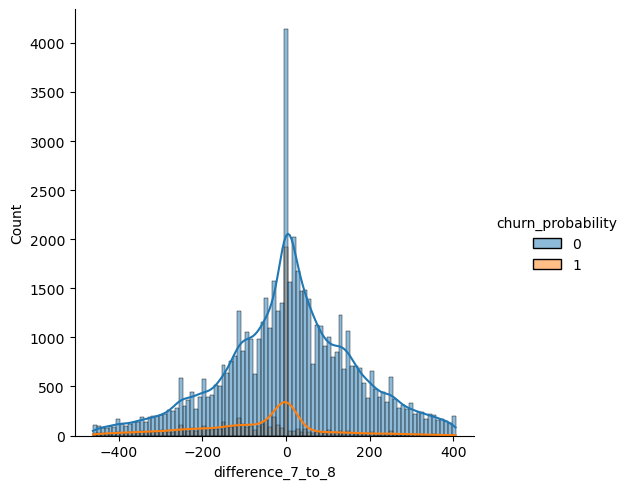

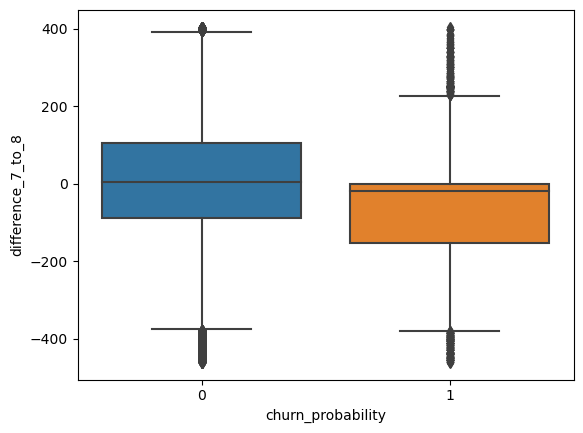

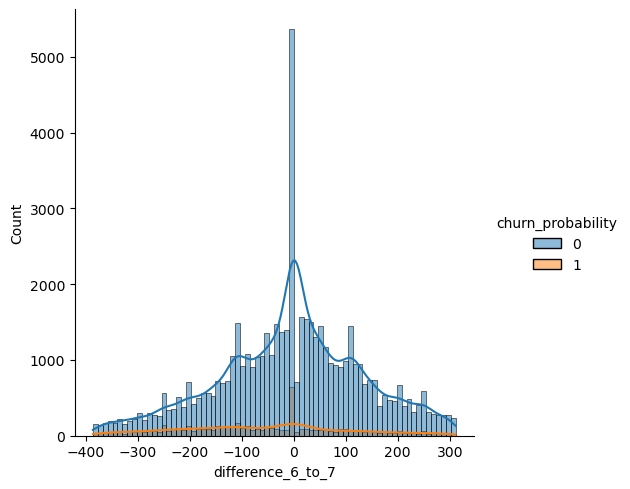

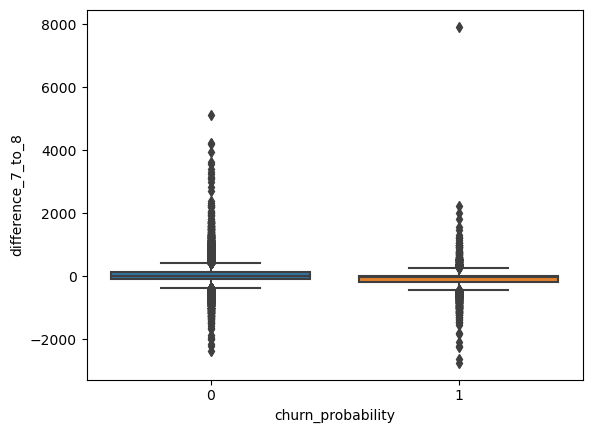

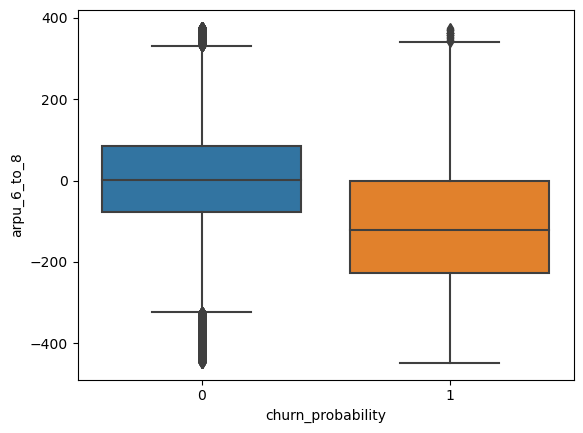

In [33]:
data_refined_1[['total_rech_amt_6','total_rech_amt_7']]
data_refined_1['difference_6_to_7']=data_refined_1['total_rech_amt_7']-data_refined_1['total_rech_amt_6']
data_refined_1['difference_7_to_8']=data_refined_1['total_rech_amt_8']-data_refined_1['total_rech_amt_7']



arr=np.array(data_refined_1['difference_7_to_8'])
uq=np.percentile(arr,70)
lq=np.percentile(arr,20)
iqr=uq-lq
ul=uq+(1.5*iqr)
ll=lq-(1.5*iqr)
grouped_df=data_refined_1[(data_refined_1['difference_7_to_8']<ul) & (data_refined_1['difference_7_to_8']>ll)]
sns.displot(data=grouped_df,x=grouped_df['difference_7_to_8'],kde=True,hue='churn_probability')
plt.show()
sns.boxplot(x=grouped_df['churn_probability'],y=grouped_df['difference_7_to_8'])

plt.show()

arr=np.array(data_refined_1['difference_6_to_7'])
uq=np.percentile(arr,70)
lq=np.percentile(arr,20)
iqr=uq-lq
ul=uq+(1*iqr)
ll=lq-(1*iqr)
grouped_df=data_refined_1[(data_refined_1['difference_6_to_7']<ul) & (data_refined_1['difference_6_to_7']>ll)]
sns.displot(data=grouped_df,x=grouped_df['difference_6_to_7'],kde=True,hue='churn_probability')
plt.show()
sns.boxplot(x=grouped_df['churn_probability'],y=grouped_df['difference_7_to_8'])
plt.show()


data_refined_1['arpu_6_to_8']=data_refined_1['arpu_8']-data_refined_1['arpu_6']



arr=np.array(data_refined_1['arpu_6_to_8'])
uq=np.percentile(arr,70)
lq=np.percentile(arr,20)
iqr=uq-lq
ul=uq+(1.5*iqr)
ll=lq-(1.5*iqr)
grouped_df=data_refined_1[(data_refined_1['arpu_6_to_8']<ul) & (data_refined_1['arpu_6_to_8']>ll)]
plt.show()
sns.boxplot(x=grouped_df['churn_probability'],y=grouped_df['arpu_6_to_8'])

plt.show()





## Steps remaining:
- Streamline the EDA process.
- 

In [34]:
data_refined_1[data_refined_1['churn_probability']==1][['arpu_6','arpu_7','arpu_8']].describe()


,arpu_6,arpu_7,arpu_8
count,7132.0000,7132.0000,7132.0000
mean,308.2891,219.0814,114.2264
std,385.7236,321.4953,245.5850
min,-209.4650,-158.9630,-155.2360
25%,96.0935,14.7453,0.0000
50%,210.6765,118.3480,9.9695
75%,409.3358,289.5435,137.0132
max,11505.5080,6876.3240,5731.3270


### EDA 

In [35]:
# Given the high number of columns, we can categorise some of the key columns with these variables
import re
total_amounts = [i for i in list(data_refined_1.columns) if re.search('total.+amt',i)]
total_outgoing_minutes = [i for i in list(data_refined_1.columns) if re.search('total.+og.+mou',i)]
total_incoming_minutes = [i for i in list(data_refined_1.columns) if re.search('total.+ic.+mou',i)]
offnetwork_minutes = [i for i in list(data_refined_1.columns) if re.search('offnet',i)]
volume_3g = [i for i in list(data_refined_1.columns) if re.search('vol.+3g',i)]
volume_2g = [i for i in list(data_refined_1.columns) if re.search('vol.+2g',i)]
age_on_network = [i for i in list(data_refined_1.columns) if re.search('aon',i)]

#Storing them in a single flat list
variables = [ 'id', 
             *total_amounts, 
             *total_incoming_minutes,
             *total_outgoing_minutes, 
             *offnetwork_minutes, 
             *volume_3g,
             *volume_2g,
             *age_on_network, 
             'churn_probability']

trim_data_for_EDA = data_refined_1[variables].set_index('id')

In [36]:
#variables
trim_data_for_EDA

,total_rech_amt_8,total_rech_amt_6,total_rech_amt_7,total_ic_mou_8,total_ic_mou_7,total_ic_mou_6,total_og_mou_8,total_og_mou_7,total_og_mou_6,offnet_mou_8,offnet_mou_6,offnet_mou_7,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_6,vol_2g_mb_8,vol_2g_mb_7,vol_2g_mb_6,aon,churn_probability
id,,,,,,,,,,,,,,,,,,,,
0,10,77,65,40.5600,53.0400,11.8400,3.6300,221.6800,81.2100,2.3300,32.2400,96.6800,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1958,0
1,50,0,145,25.0400,39.4400,3.4400,31.6600,30.7300,0.0000,30.8900,0.0000,25.9900,3.9600,0.0000,0.0000,0.0000,352.9100,0.0000,710,0
2,0,70,120,36.6400,33.8300,124.2900,0.0000,99.3600,56.4900,0.0000,53.9900,82.0500,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,882,0
3,130,160,240,83.8400,50.1800,95.1100,53.8400,95.9800,76.0300,50.2300,68.7600,78.4800,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,982,0
4,122,290,136,28.3100,9.3600,21.5400,15.7600,42.9400,63.2600,9.6300,56.9900,38.1100,0.0000,0.0000,0.0000,213.4700,308.8900,390.8000,647,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69994,512,50,397,269.5600,221.9900,0.0000,392.5800,496.6800,0.0000,381.6400,0.0000,488.4600,0.0000,0.0000,0.0000,144.3100,244.5900,0.0000,221,0
69995,308,200,313,136.0100,112.4300,80.2400,280.6900,292.7400,166.2100,48.0600,49.5300,96.2800,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,712,0
69996,397,626,250,414.5400,416.5800,542.1800,342.2900,296.3900,412.6800,263.8400,335.5400,227.9400,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,879,0


In [37]:
# Selecting the Numerical and Categorical features for analysis

numeric_cols = trim_data_for_EDA.select_dtypes(include=['float64','int64']).columns
categorical_cols = flag_cols+['month_present_7','month_present_8']
categorical_cols

['night_pck_user_6',
 'night_pck_user_7',
 'night_pck_user_8',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8',
 'month_present_7',
 'month_present_8']

#### Univariate analysis

Column: total_rech_amt_8, Missing Data: 0.00%


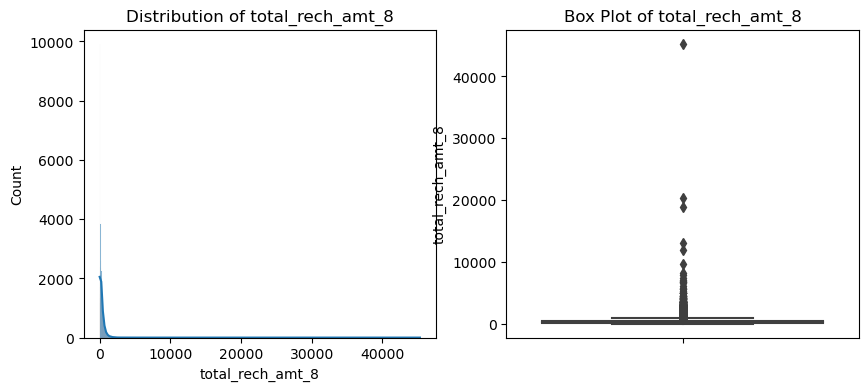

Column: total_rech_amt_6, Missing Data: 0.00%


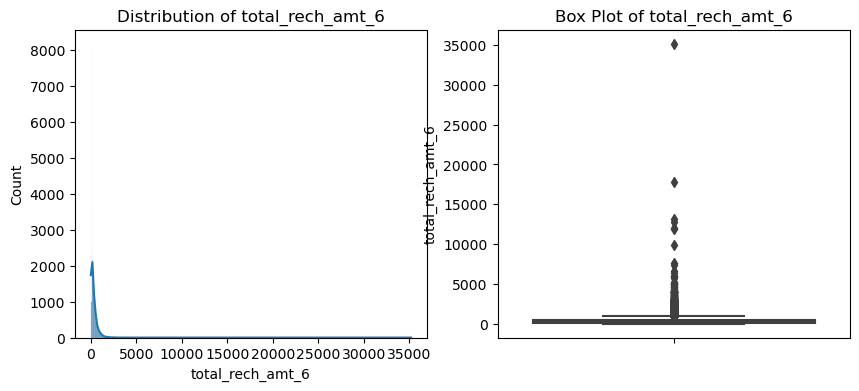

Column: total_rech_amt_7, Missing Data: 0.00%


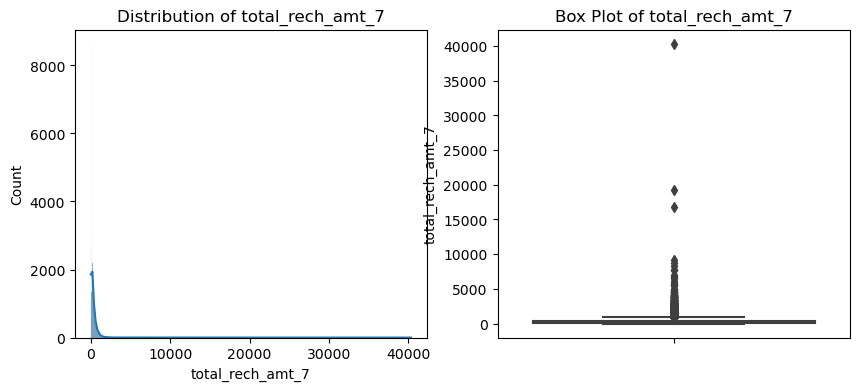

Column: total_ic_mou_8, Missing Data: 0.00%


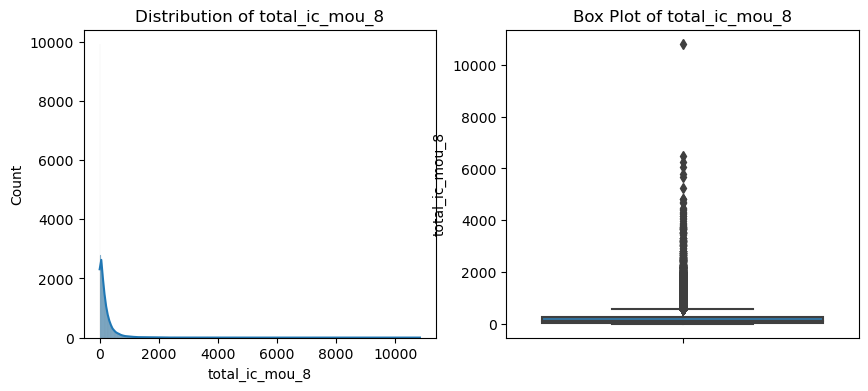

Column: total_ic_mou_7, Missing Data: 0.00%


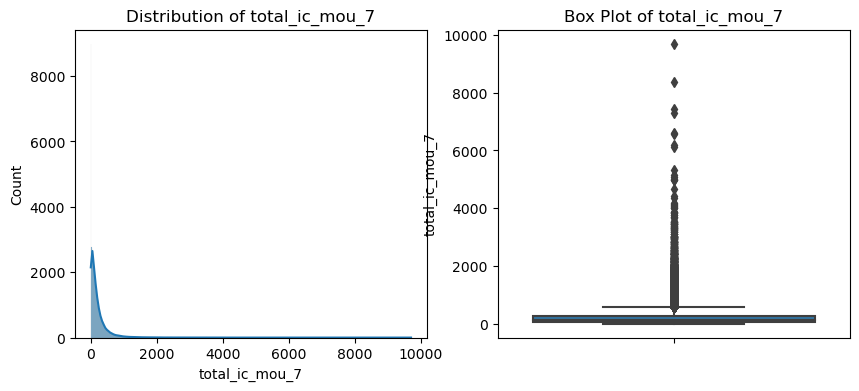

Column: total_ic_mou_6, Missing Data: 0.00%


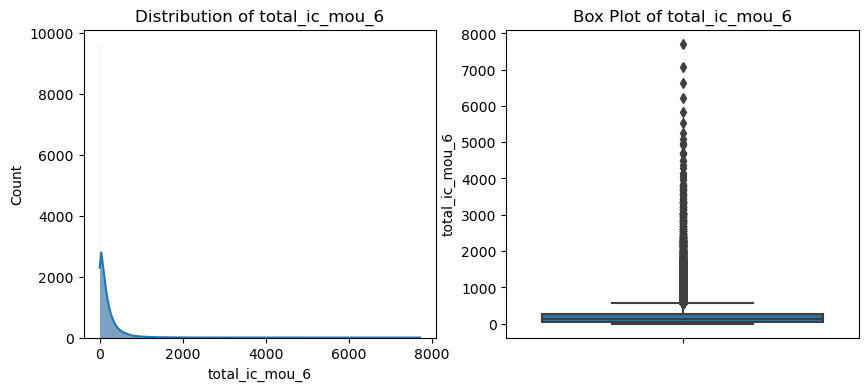

Column: total_og_mou_8, Missing Data: 0.00%


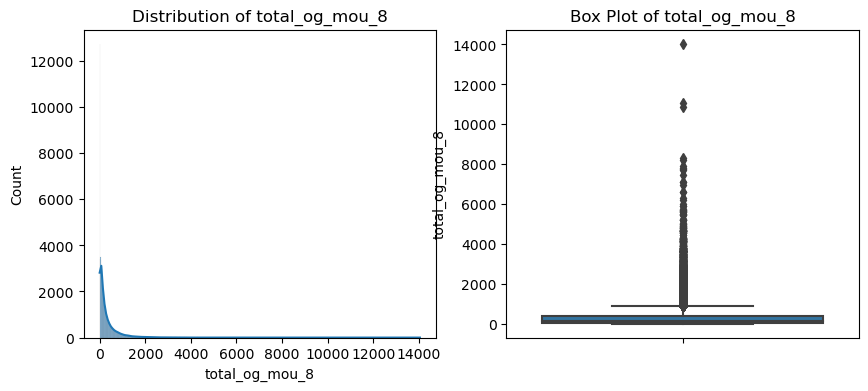

Column: total_og_mou_7, Missing Data: 0.00%


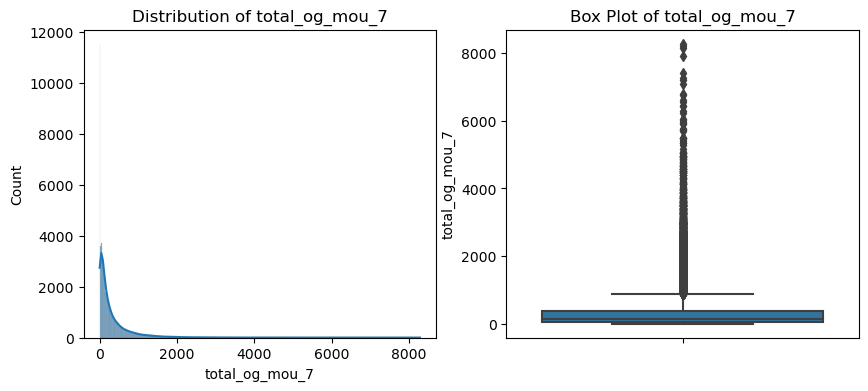

Column: total_og_mou_6, Missing Data: 0.00%


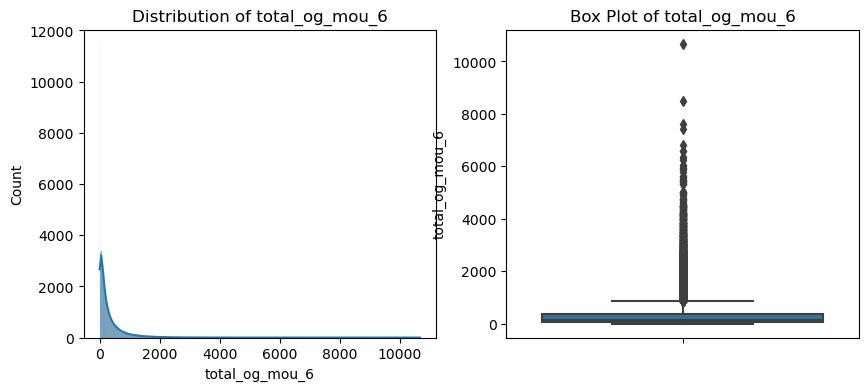

Column: offnet_mou_8, Missing Data: 0.00%


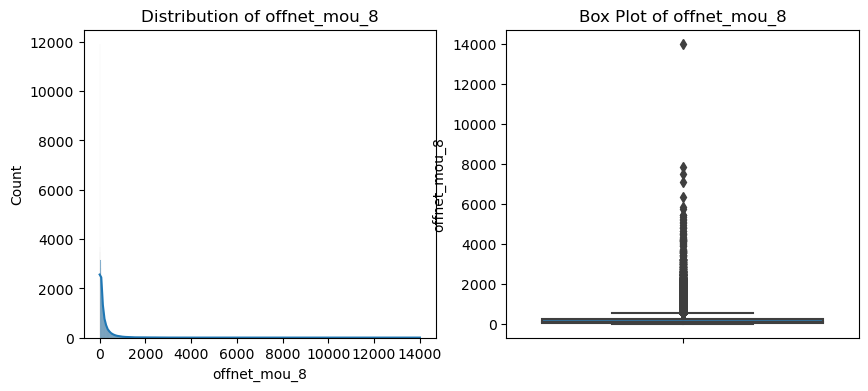

Column: offnet_mou_6, Missing Data: 0.00%


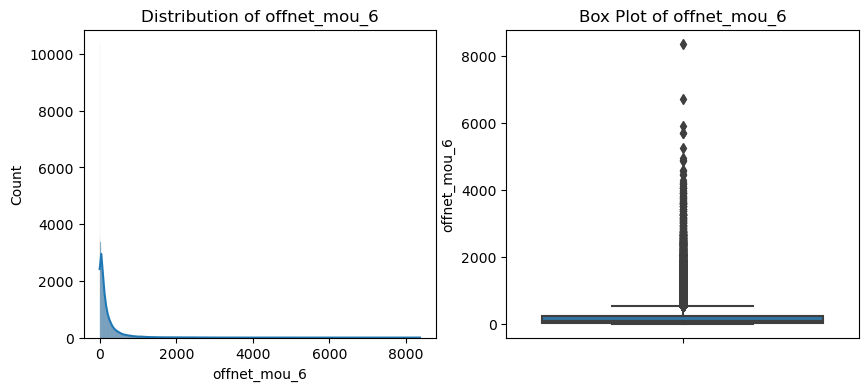

Column: offnet_mou_7, Missing Data: 0.00%


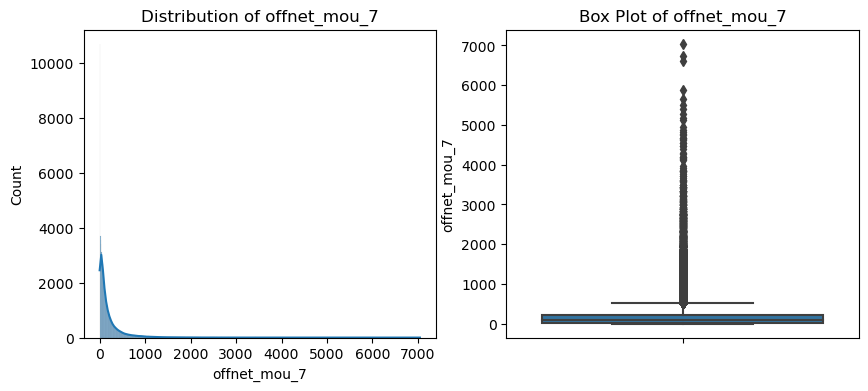

Column: vol_3g_mb_7, Missing Data: 0.00%


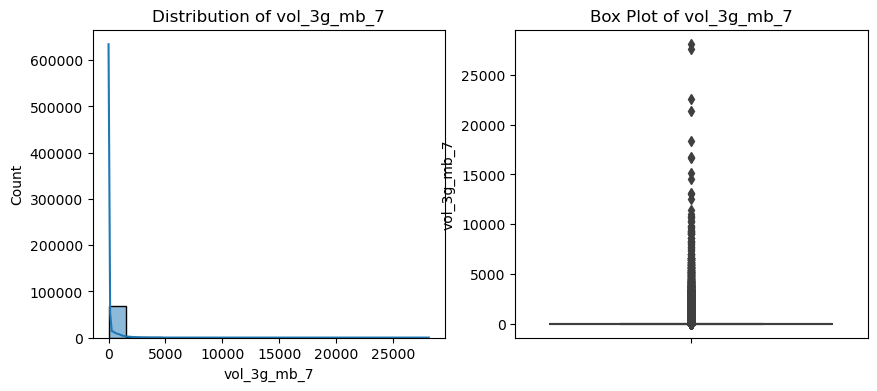

Column: vol_3g_mb_8, Missing Data: 0.00%


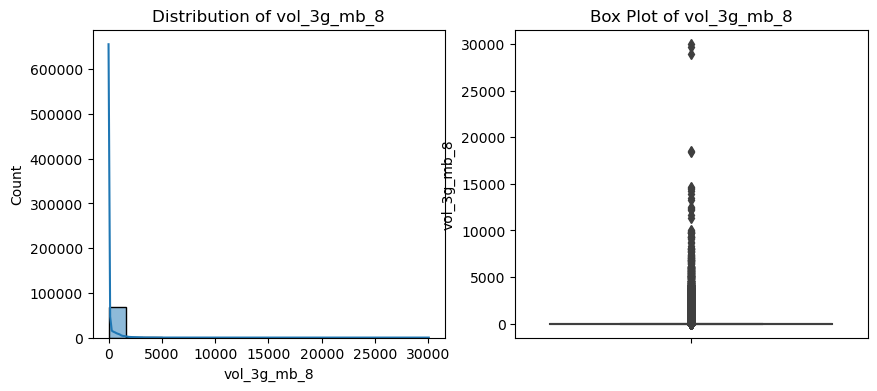

Column: vol_3g_mb_6, Missing Data: 0.00%


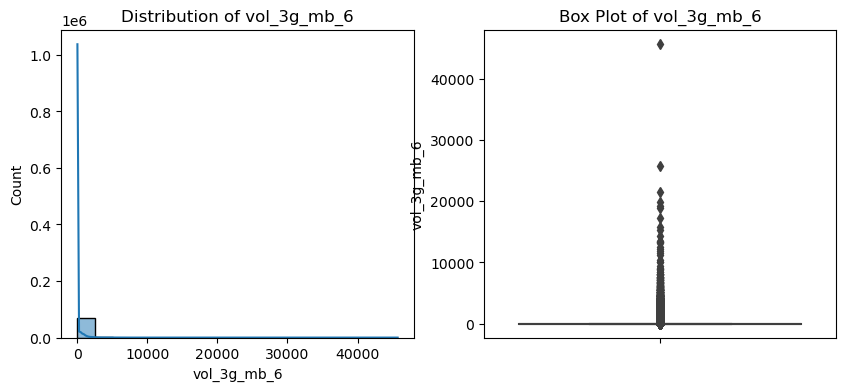

Column: vol_2g_mb_8, Missing Data: 0.00%


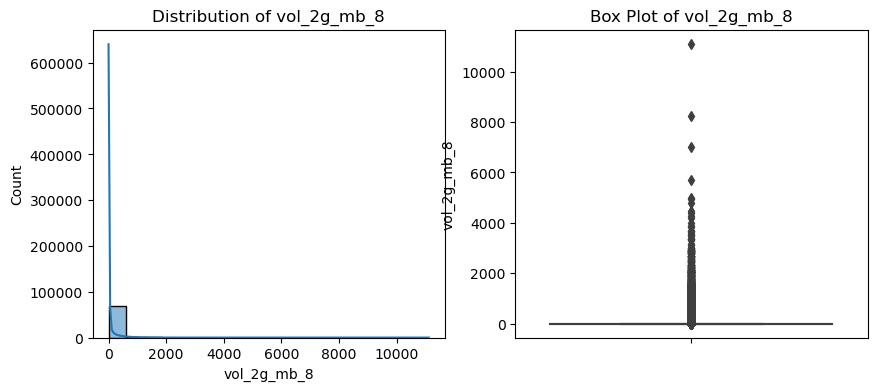

Column: vol_2g_mb_7, Missing Data: 0.00%


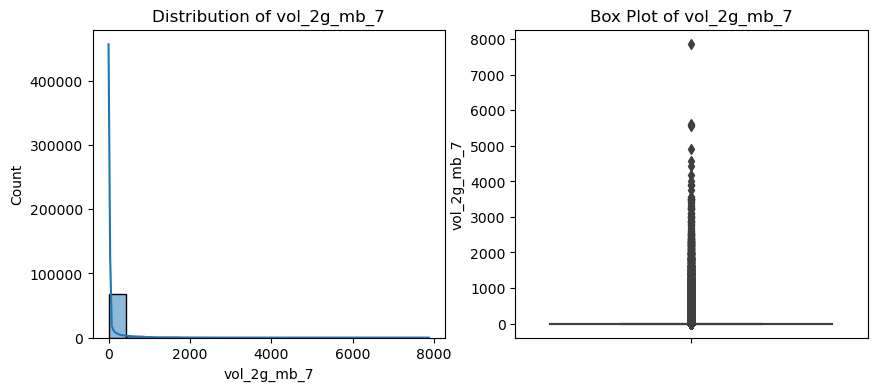

Column: vol_2g_mb_6, Missing Data: 0.00%


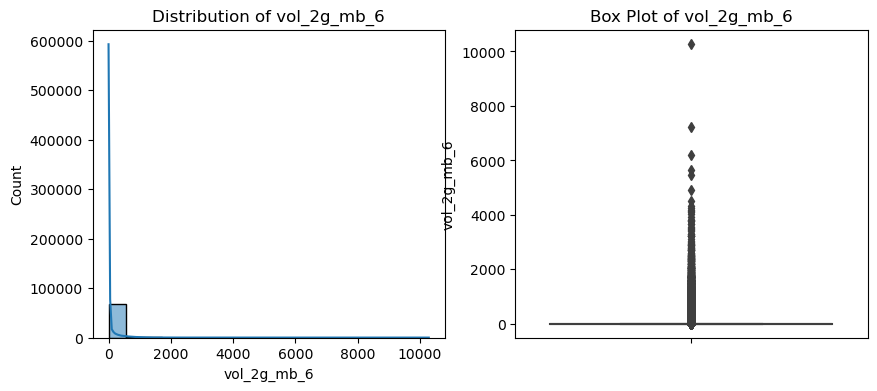

Column: aon, Missing Data: 0.00%


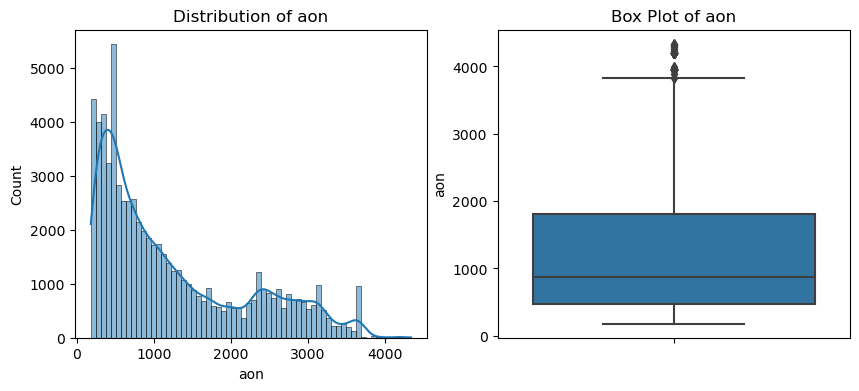

Column: churn_probability, Missing Data: 0.00%


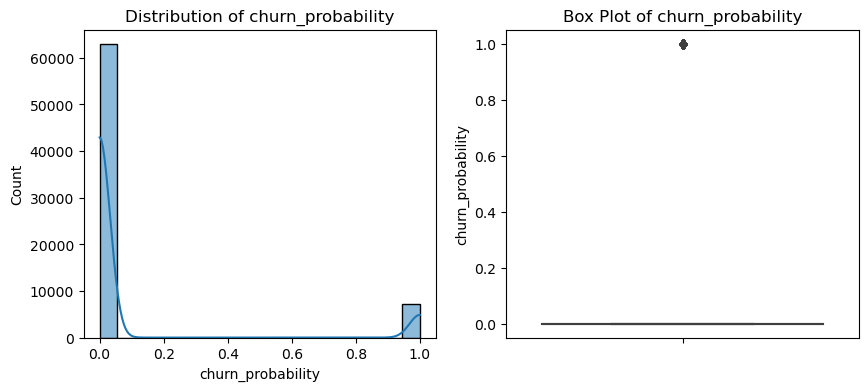

Column: night_pck_user_6, Missing Data: 0.00%


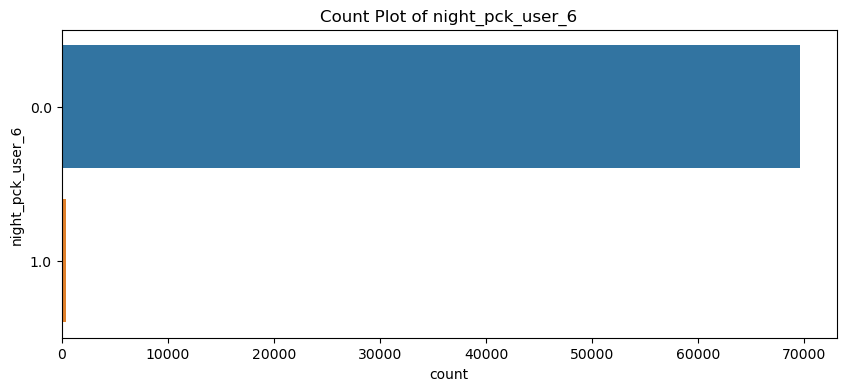

Column: night_pck_user_7, Missing Data: 0.00%


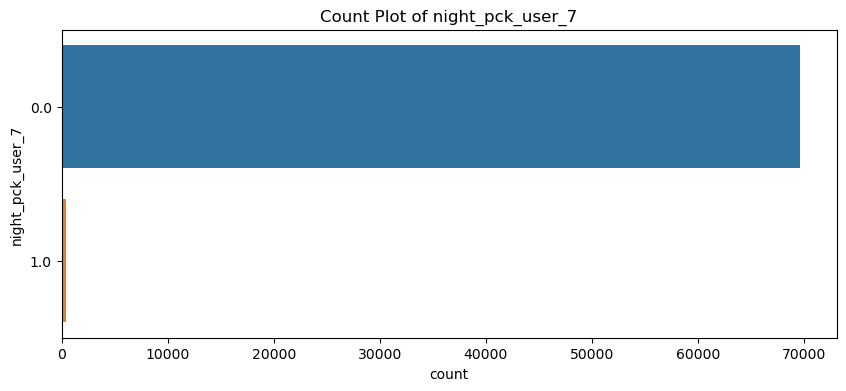

Column: night_pck_user_8, Missing Data: 0.00%


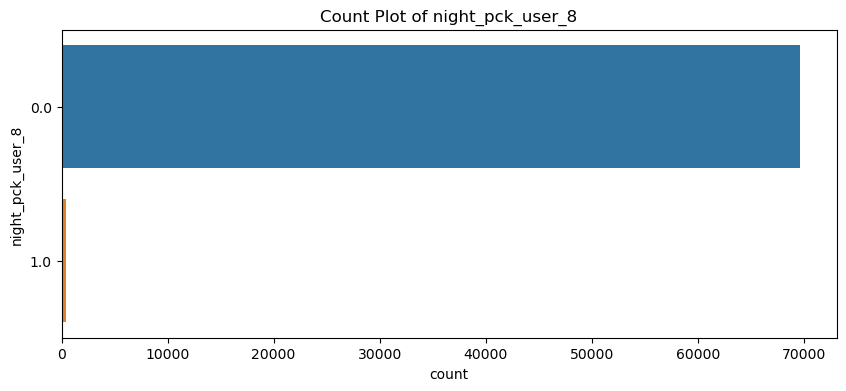

Column: fb_user_6, Missing Data: 0.00%


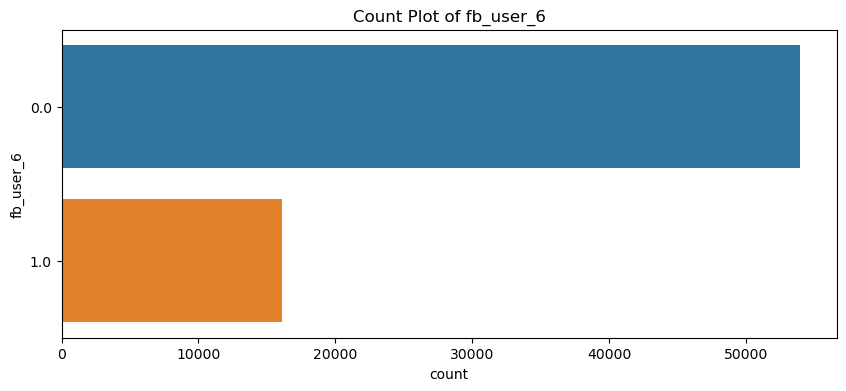

Column: fb_user_7, Missing Data: 0.00%


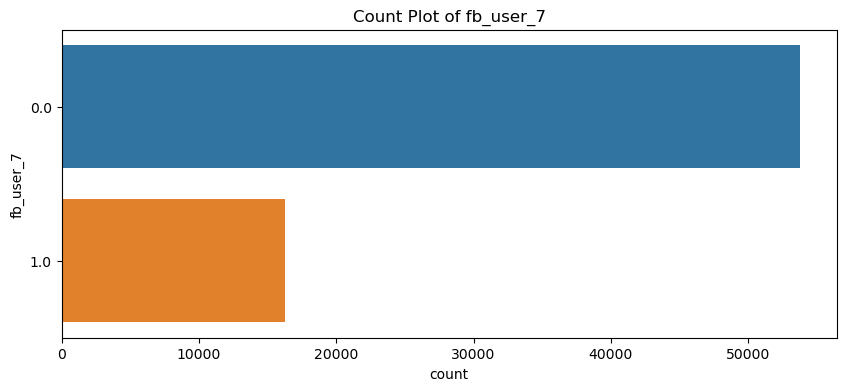

Column: fb_user_8, Missing Data: 0.00%


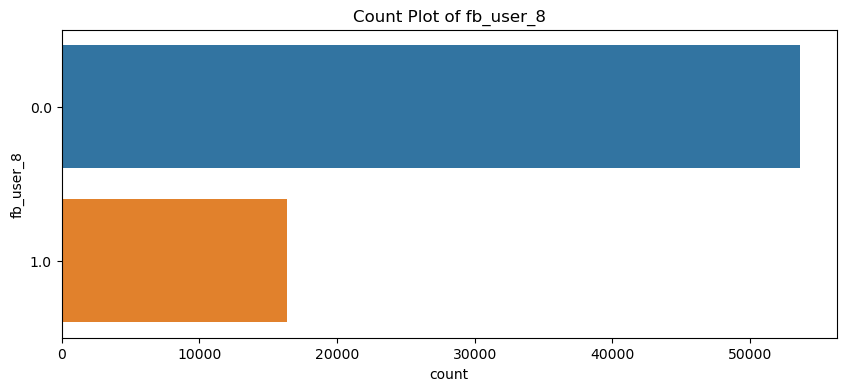

Column: month_present_7, Missing Data: 0.00%


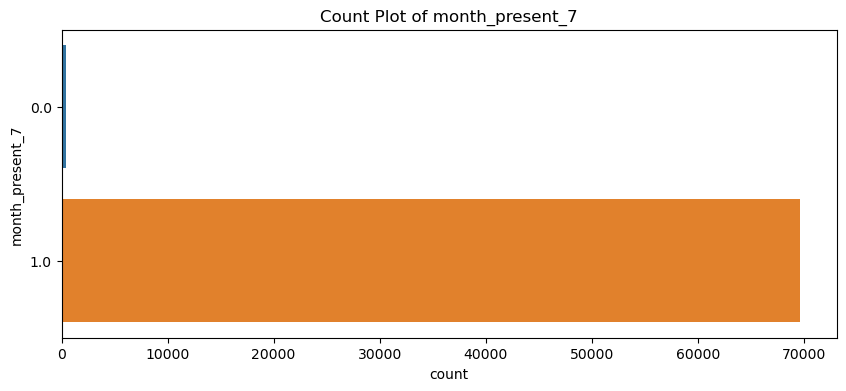

Column: month_present_8, Missing Data: 0.00%


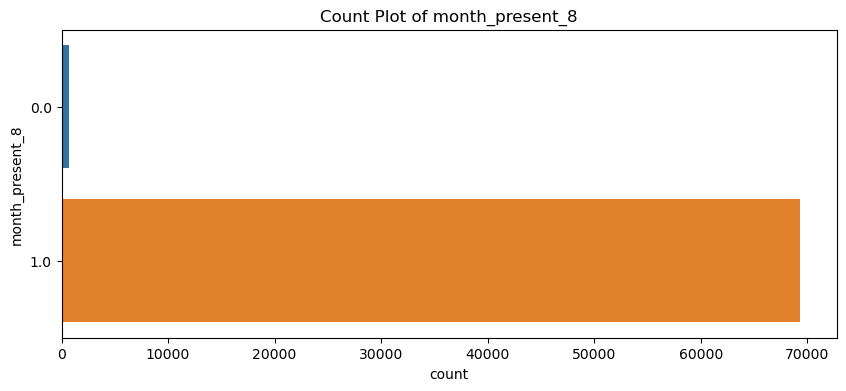

In [38]:
# Define a function for univariate analysis to draw the following only;

# distribution and box plot for numerical columns and;
# count plot for categorical columns

def univariate_analysis(df, column_list, plot_type='numerical'):
    for column in column_list:
        if column not in df.columns:
            print(f"Column {column} not found in dataframe.")
            continue

        missing_percentage = df[column].isna().sum() / len(df) * 100
        print(f"Column: {column}, Missing Data: {missing_percentage:.2f}%")

        if missing_percentage < 30:
            plt.figure(figsize=(10, 4))

            if plot_type == 'numerical':
                # Distribution plot for numerical data
                plt.subplot(1, 2, 1)
                sns.histplot(df[column].dropna(), kde=True)
                plt.title(f'Distribution of {column}')

                plt.subplot(1, 2, 2)
                sns.boxplot(y=df[column].dropna())
                plt.title(f'Box Plot of {column}')
            elif plot_type == 'categorical':
                # Count plot for categorical data
                sns.countplot(y=df[column].dropna())
                plt.title(f'Count Plot of {column}')
            
            plt.show()
        else:
            print(f"Skipping {column} due to high percentage of missing data.")

univariate_analysis(data_refined_1, numeric_cols, plot_type='numerical')
univariate_analysis(data_refined_1, categorical_cols, plot_type='categorical')

#### Bivariate analysis

night_pck_user_6


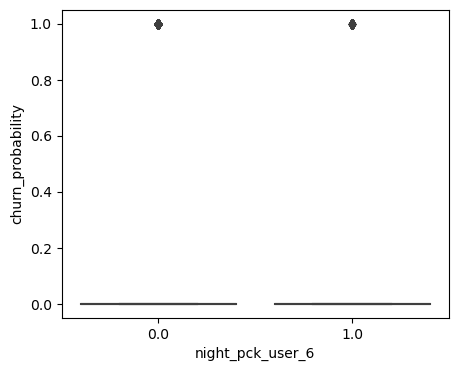

night_pck_user_7


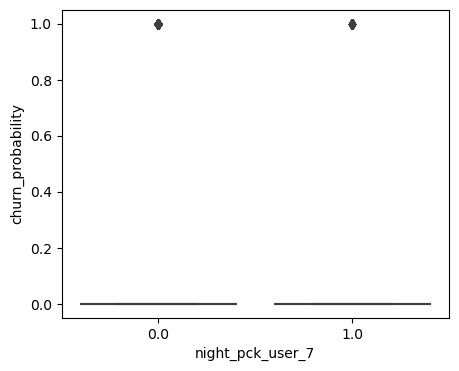

night_pck_user_8


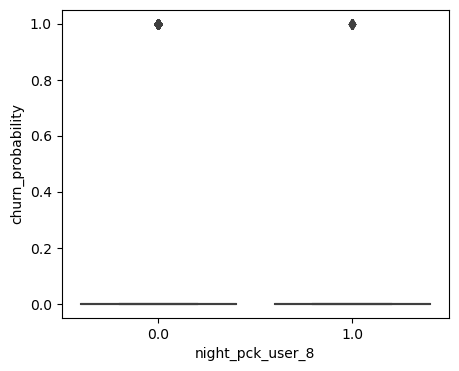

fb_user_6


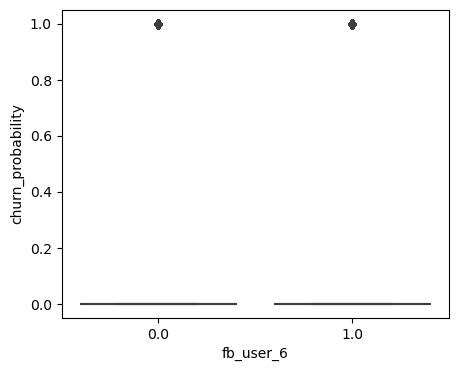

fb_user_7


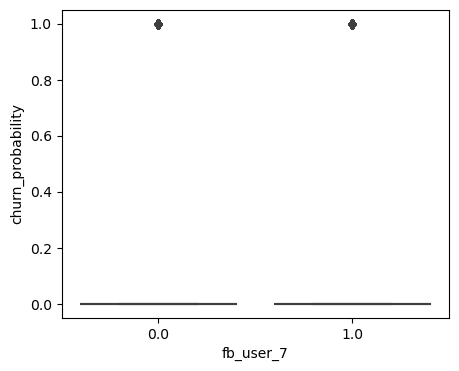

fb_user_8


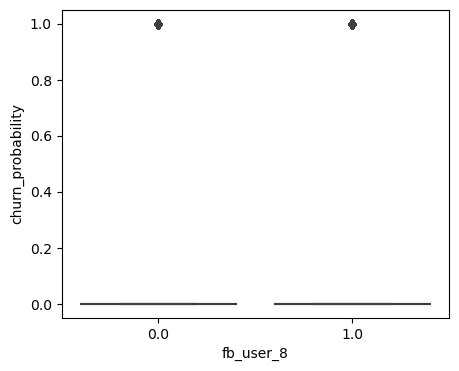

month_present_7


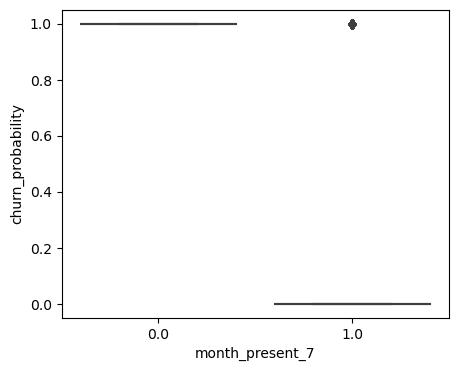

month_present_8


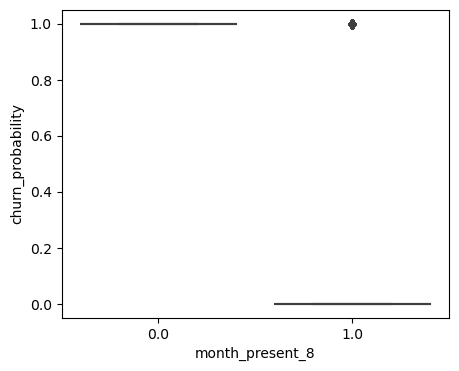

In [39]:
# Bivariate analysis - Box plots for all categorical predictor variables against the target variable saleprice

for col1 in categorical_cols:
        print(col1)
        plt.figure(figsize=(5, 4))
        sns.boxplot(x=col1,y='churn_probability', data = data_refined_1)
        plt.show()

#### Key observation: Churn probability is always 1 for where months present 7 and 8 are 0. 

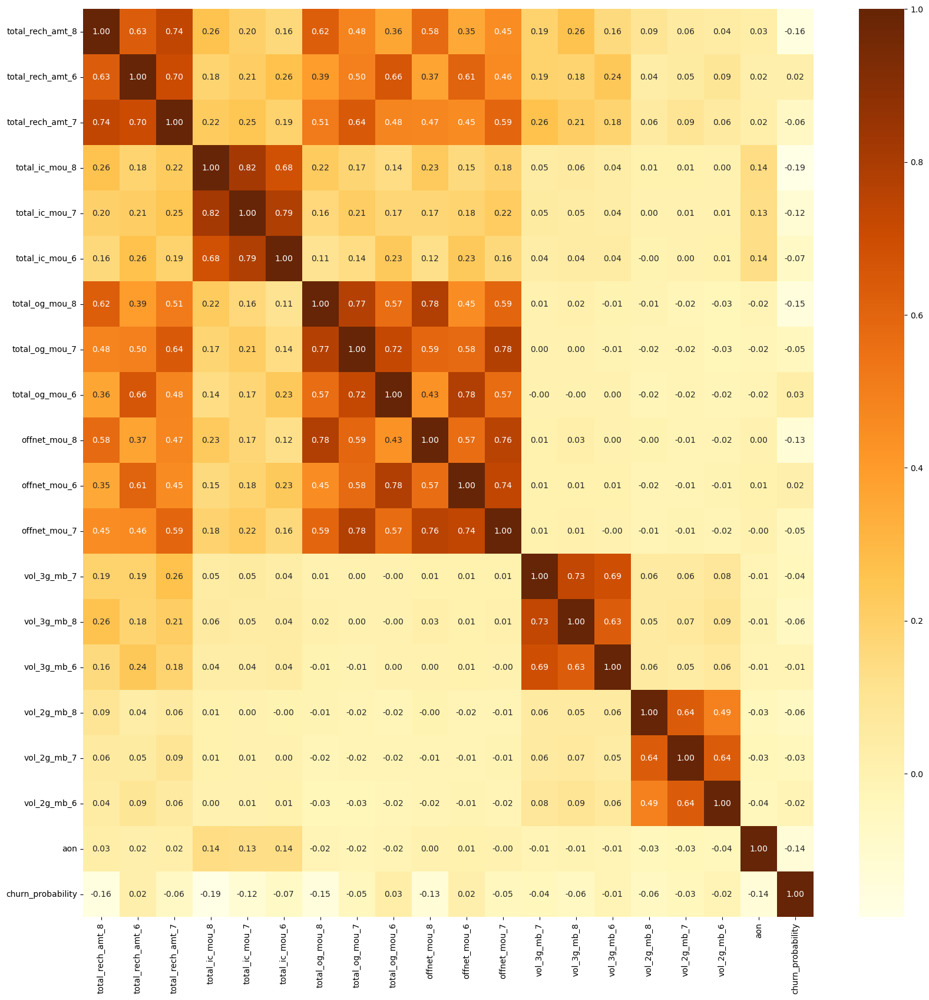

In [40]:
# Correlations
plt.figure(figsize=(20,20))
sns.heatmap(data_refined_1[numeric_cols].corr(),annot=True,fmt='.2f',cmap="YlOrBr")
plt.show()

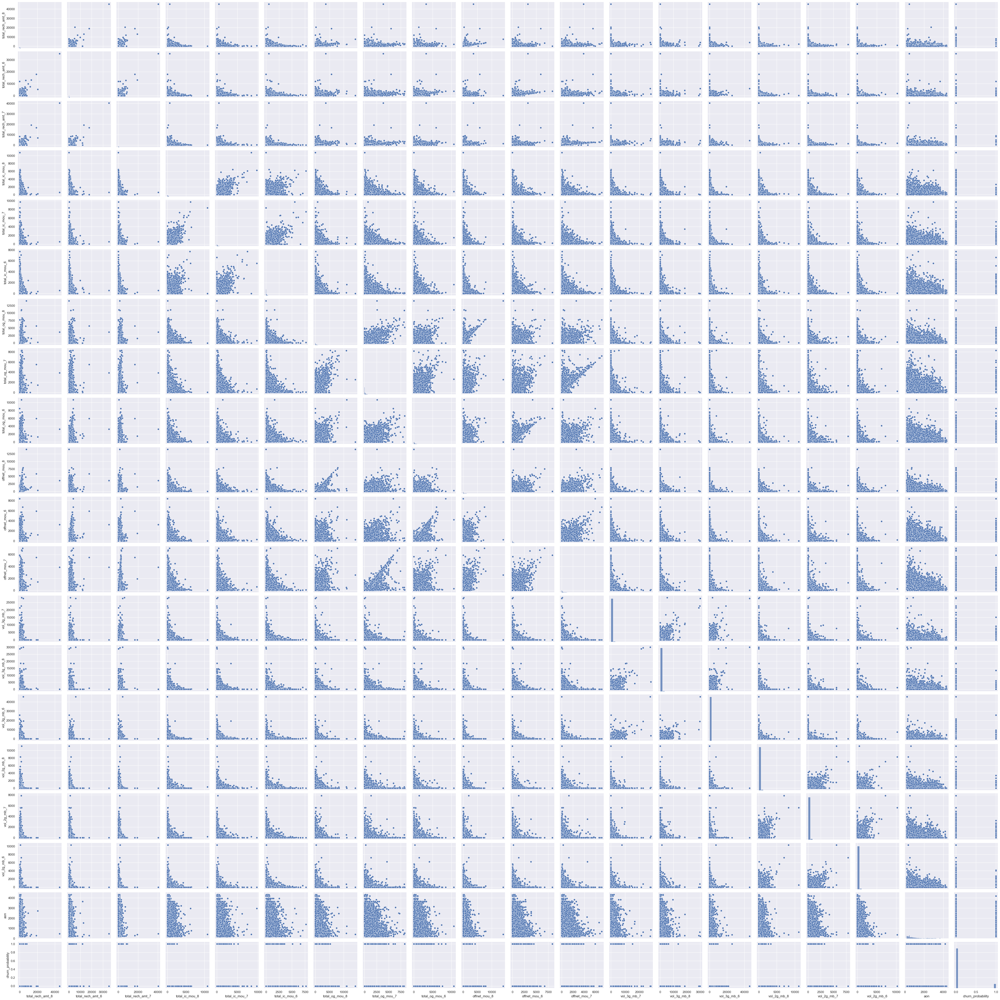

In [41]:
# Pairplots 
sns.set()
sns.pairplot(data=data_refined_1,vars=numeric_cols, size=2.5)
plt.show()

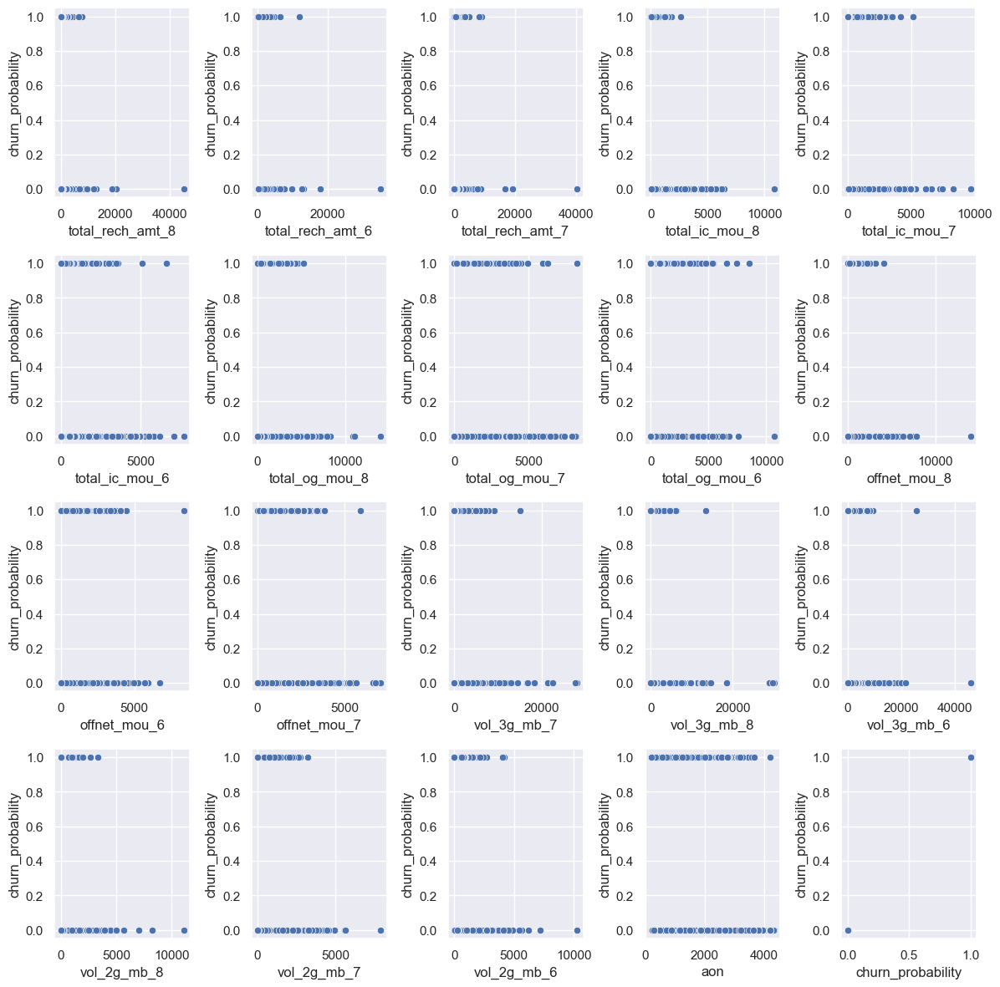

In [42]:
#Check the impact of these columns with SalePrice for predictive ability

fig=plt.subplots(figsize=(12, 12))

for i, col in enumerate(numeric_cols):
    plt.subplot(4, 5, i+1)
    plt.subplots_adjust(hspace = 4.0)
    sns.scatterplot(x=data_refined_1[col],y=data_refined_1['churn_probability'])
    plt.tight_layout()

#### Next Steps in the analysis and modelling

1. Calculate differences in recharge amounts and counts between the months 6(good phase) and 7 (action phase)
2. Drop columns related to the churn month (_8) from the analysis
3. Perform EDA again following these changes
4. Standard Scaler
5. PCA
6. Build models (start with Logistic Regression)
7. Before predicting on test data, apply all the data transformation including scaling & PCA on test data too.
8. Predictions
9. Model evaluations


In [43]:
# Converting the dates to recency and finally converting them to numerical variables:
#import datetime as dt
#for i in other_variables:
 #   data_refined_1[i]=pd.to_datetime(data_refined_1[i],format='%m/%d/%Y')
    
 #   data_refined_1['recency_'+i]=data_refined_1[i].max()-data_refined_1[i]
 #   data_refined_1['recency_'+i]=data_refined_1['recency_'+i].dt.days
 #   data_refined_1=data_refined_1.drop(i,axis=1)

    


In [44]:
# Removing the columns which do not have any variance:
#cols=data_refined_1.describe().columns
#cols=cols[(np.array(data_refined_1.describe()['std':])!=0)[0]]
#data_final=data_refined_1[cols]

In [45]:
# Having a final look at the info of the data:
#data_final.info(verbose=1)

#### Scaling:

In [46]:
# Using SimpleImputer to impute the data with median values:
#from sklearn.impute import SimpleImputer
#imputer=SimpleImputer(strategy='median')
#arr=imputer.fit_transform(data_final)

In [47]:
# Scaling the data:

from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
arr_scaled=scaler.fit_transform(data_refined_1)
df=pd.DataFrame(arr_scaled)
df.columns=data_refined_1.columns

# All the columns are now numeric columns:
num_variables=list(df.columns)
num_variables

['loc_ic_t2t_mou_8',
 'loc_ic_mou_8',
 'std_ic_t2m_mou_8',
 'loc_og_t2m_mou_8',
 'std_og_t2f_mou_8',
 'std_ic_t2t_mou_8',
 'loc_og_t2f_mou_8',
 'std_og_t2m_mou_8',
 'loc_og_t2c_mou_8',
 'og_others_8',
 'loc_ic_t2f_mou_8',
 'loc_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_ic_t2m_mou_8',
 'std_og_mou_8',
 'std_ic_mou_8',
 'std_ic_t2f_mou_8',
 'roam_og_mou_8',
 'spl_og_mou_8',
 'roam_ic_mou_8',
 'spl_ic_mou_8',
 'offnet_mou_8',
 'isd_ic_mou_8',
 'onnet_mou_8',
 'isd_og_mou_8',
 'ic_others_8',
 'std_og_t2t_mou_8',
 'loc_ic_t2t_mou_6',
 'spl_og_mou_6',
 'og_others_6',
 'std_ic_t2f_mou_6',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2f_mou_6',
 'loc_ic_mou_6',
 'std_ic_t2t_mou_6',
 'std_ic_t2m_mou_6',
 'std_ic_mou_6',
 'spl_ic_mou_6',
 'isd_ic_mou_6',
 'ic_others_6',
 'isd_og_mou_6',
 'loc_og_t2f_mou_6',
 'std_og_t2f_mou_6',
 'roam_og_mou_6',
 'std_og_t2m_mou_6',
 'loc_og_t2t_mou_6',
 'loc_og_mou_6',
 'roam_ic_mou_6',
 'std_og_t2t_mou_6',
 'loc_og_t2c_mou_6',
 'offnet_mou_6',
 'loc_og_t2m_mou_6',
 'onnet_mou_6

In [48]:
def outlier_removal(arr,k):
    upper_limit=np.percentile(arr,80)
    lower_limit=np.percentile(arr,20)
    iqr=upper_limit-lower_limit
    arr=df[(arr>lower_limit-k*iqr) and (arr<upper_limit+k*iqr)]
    return arr

In [49]:
df.describe()

,loc_ic_t2t_mou_8,loc_ic_mou_8,std_ic_t2m_mou_8,loc_og_t2m_mou_8,std_og_t2f_mou_8,std_ic_t2t_mou_8,loc_og_t2f_mou_8,std_og_t2m_mou_8,loc_og_t2c_mou_8,og_others_8,loc_ic_t2f_mou_8,loc_og_mou_8,loc_og_t2t_mou_8,loc_ic_t2m_mou_8,std_og_mou_8,std_ic_mou_8,std_ic_t2f_mou_8,roam_og_mou_8,spl_og_mou_8,roam_ic_mou_8,spl_ic_mou_8,offnet_mou_8,isd_ic_mou_8,onnet_mou_8,isd_og_mou_8,ic_others_8,std_og_t2t_mou_8,loc_ic_t2t_mou_6,spl_og_mou_6,og_others_6,std_ic_t2f_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,isd_og_mou_6,loc_og_t2f_mou_6,std_og_t2f_mou_6,roam_og_mou_6,std_og_t2m_mou_6,loc_og_t2t_mou_6,loc_og_mou_6,roam_ic_mou_6,std_og_t2t_mou_6,loc_og_t2c_mou_6,offnet_mou_6,loc_og_t2m_mou_6,onnet_mou_6,std_og_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_7,roam_og_mou_7,std_og_mou_7,std_ic_mou_7,std_ic_t2m_mou_7,roam_ic_mou_7,spl_ic_mou_7,offnet_mou_7,isd_ic_mou_7,onnet_mou_7,ic_others_7,isd_og_mou_7,std_ic_t2f_mou_7,loc_og_t2f_mou_7,std_og_t2m_mou_7,loc_og_t2c_mou_7,spl_og_mou_7,loc_ic_mou_7,loc_og_mou_7,loc_ic_t2f_mou_7,std_og_t2t_mou_7,loc_ic_t2m_mou_7,std_og_t2f_mou_7,og_others_7,std_ic_t2t_mou_7,loc_ic_t2t_mou_7,vol_2g_mb_8,jul_vbc_3g,night_pck_user_6,aon,aug_vbc_3g,jun_vbc_3g,vol_2g_mb_7,night_pck_user_7,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_6,vol_2g_mb_6,sachet_3g_6,night_pck_user_8,monthly_3g_8,fb_user_8,fb_user_7,fb_user_6,av_rech_amt_data_7,sachet_3g_8,sachet_3g_7,monthly_3g_7,monthly_2g_6,monthly_3g_6,sachet_2g_8,sachet_2g_7,sachet_2g_6,monthly_2g_8,monthly_2g_7,av_rech_amt_data_8,id,av_rech_amt_data_6,total_rech_amt_8,total_rech_amt_6,total_rech_num_8,total_rech_num_7,total_rech_num_6,total_ic_mou_8,total_ic_mou_7,total_ic_mou_6,total_og_mou_8,total_og_mou_7,total_og_mou_6,arpu_8,arpu_7,arpu_6,total_rech_amt_7,max_rech_amt_6,count_rech_3g_8,max_rech_amt_7,count_rech_3g_7,count_rech_3g_6,count_rech_2g_8,count_rech_2g_7,count_rech_2g_6,max_rech_data_8,max_rech_data_7,max_rech_data_6,total_rech_data_8,total_rech_data_7,total_rech_data_6,last_day_rch_amt_8,last_day_rch_amt_7,last_day_rch_amt_6,max_rech_amt_8,churn_probability,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_7,month_present_8,difference_6_to_7,difference_7_to_8,arpu_6_to_8
count,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000
mean,0.0042,0.

## EDA

### Univariate Analysis:

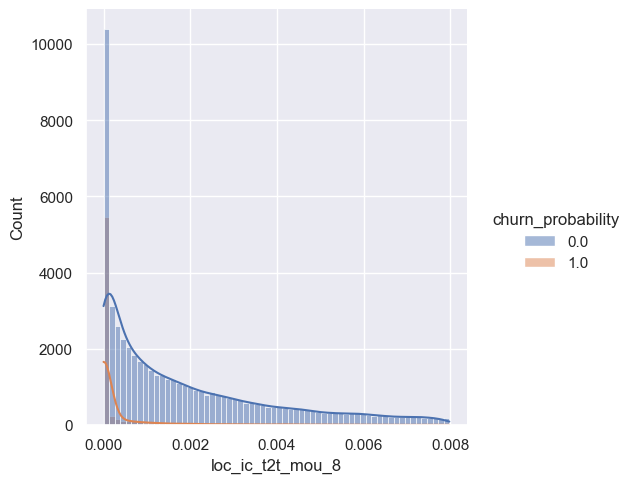

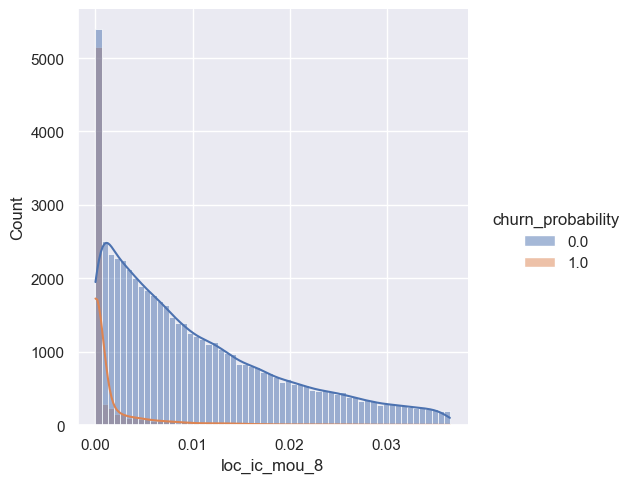

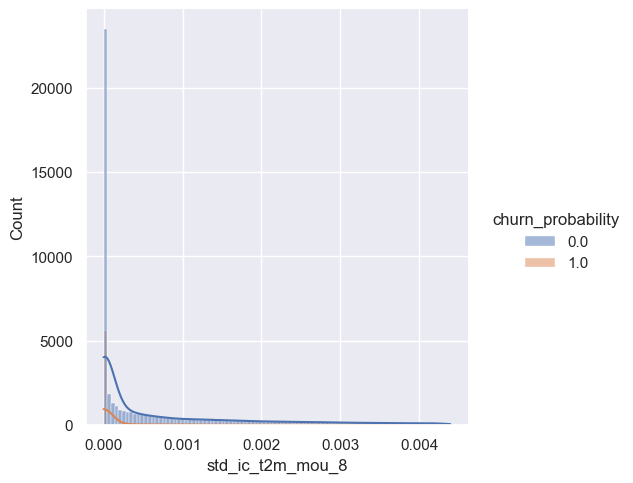

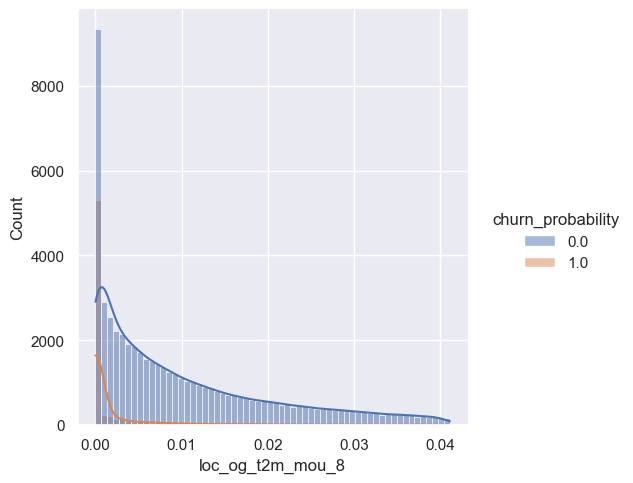

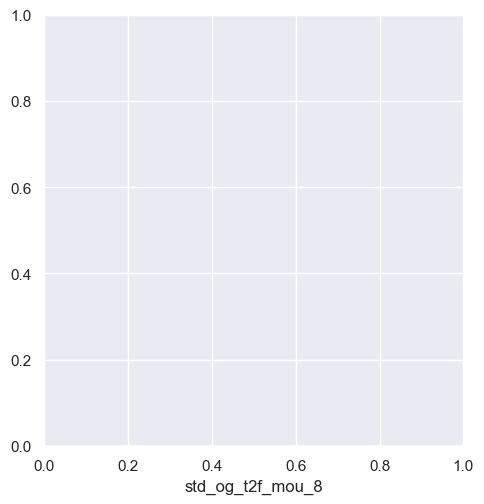

...

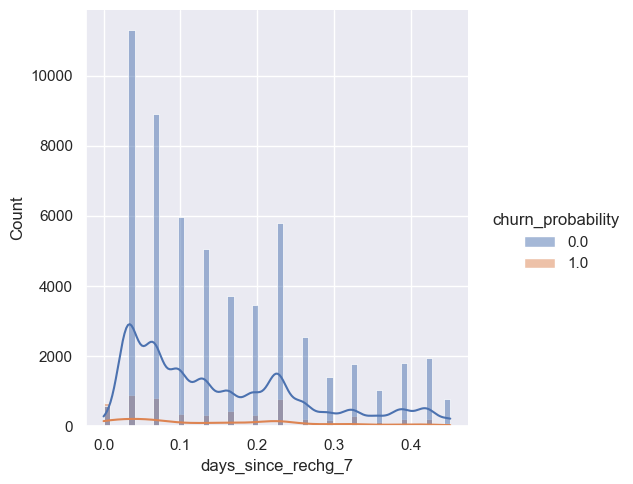

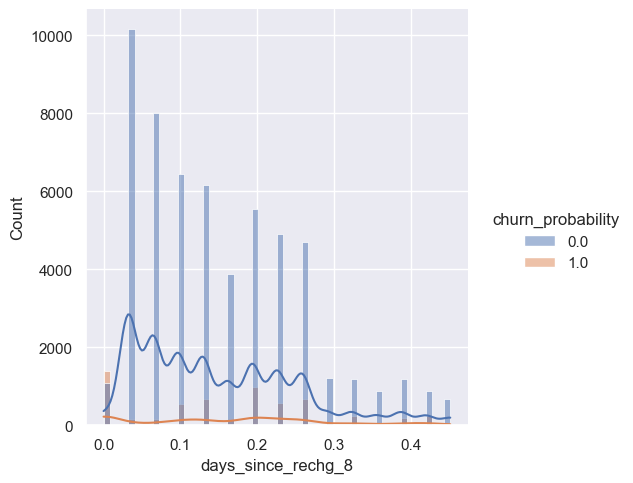

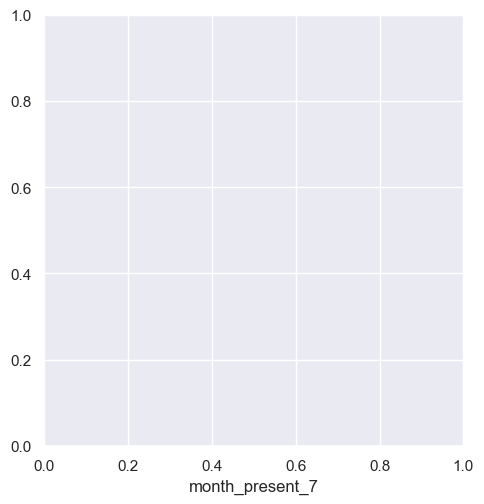

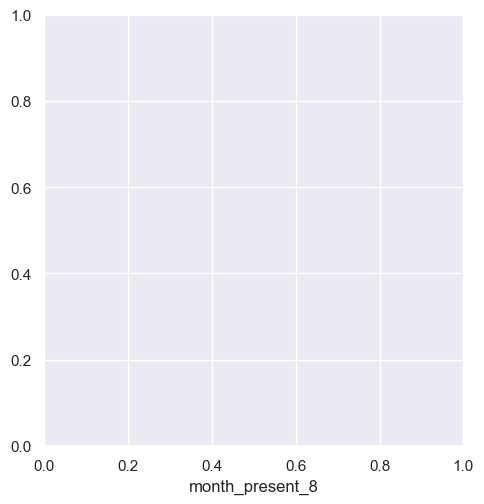

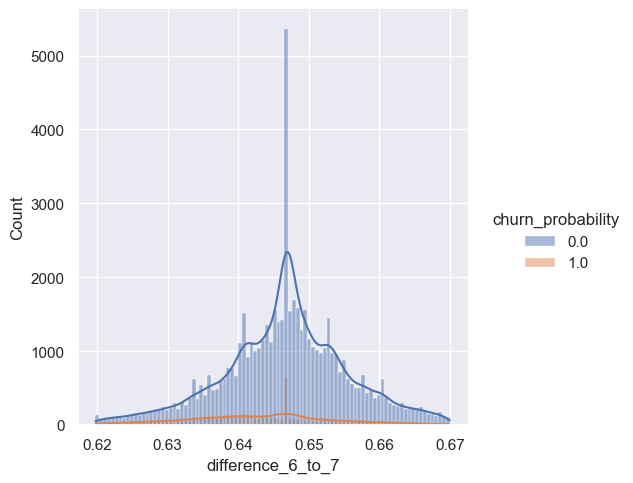

KeyboardInterrupt: 

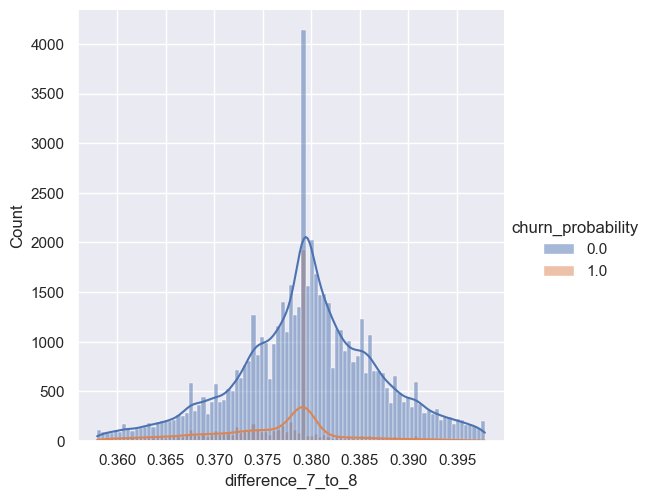

In [50]:
for i in num_variables:
    arr=np.array(df[i])
    uq=np.percentile(arr,70)
    lq=np.percentile(arr,20)
    iqr=uq-lq
    ul=uq+(1.5*iqr)
    ll=lq-(1.5*iqr)
    grouped_df=df[(df[i]<ul) & (df[i]>ll)]
    sns.displot(data=grouped_df,x=grouped_df[i],kde=True,hue='churn_probability')
    plt.xlabel(i)
    plt.show()

## Model Building:


In [51]:
# Splitting the data to X and y:
y=data_refined_1.pop('churn_probability')
X=data_refined_1


In [52]:
X

,loc_ic_t2t_mou_8,loc_ic_mou_8,std_ic_t2m_mou_8,loc_og_t2m_mou_8,std_og_t2f_mou_8,std_ic_t2t_mou_8,loc_og_t2f_mou_8,std_og_t2m_mou_8,loc_og_t2c_mou_8,og_others_8,loc_ic_t2f_mou_8,loc_og_mou_8,loc_og_t2t_mou_8,loc_ic_t2m_mou_8,std_og_mou_8,std_ic_mou_8,std_ic_t2f_mou_8,roam_og_mou_8,spl_og_mou_8,roam_ic_mou_8,spl_ic_mou_8,offnet_mou_8,isd_ic_mou_8,onnet_mou_8,isd_og_mou_8,ic_others_8,std_og_t2t_mou_8,loc_ic_t2t_mou_6,spl_og_mou_6,og_others_6,std_ic_t2f_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,isd_og_mou_6,loc_og_t2f_mou_6,std_og_t2f_mou_6,roam_og_mou_6,std_og_t2m_mou_6,loc_og_t2t_mou_6,loc_og_mou_6,roam_ic_mou_6,std_og_t2t_mou_6,loc_og_t2c_mou_6,offnet_mou_6,loc_og_t2m_mou_6,onnet_mou_6,std_og_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_7,roam_og_mou_7,std_og_mou_7,std_ic_mou_7,std_ic_t2m_mou_7,roam_ic_mou_7,spl_ic_mou_7,offnet_mou_7,isd_ic_mou_7,onnet_mou_7,ic_others_7,isd_og_mou_7,std_ic_t2f_mou_7,loc_og_t2f_mou_7,std_og_t2m_mou_7,loc_og_t2c_mou_7,spl_og_mou_7,loc_ic_mou_7,loc_og_mou_7,loc_ic_t2f_mou_7,std_og_t2t_mou_7,loc_ic_t2m_mou_7,std_og_t2f_mou_7,og_others_7,std_ic_t2t_mou_7,loc_ic_t2t_mou_7,vol_2g_mb_8,jul_vbc_3g,night_pck_user_6,aon,aug_vbc_3g,jun_vbc_3g,vol_2g_mb_7,night_pck_user_7,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_6,vol_2g_mb_6,sachet_3g_6,night_pck_user_8,monthly_3g_8,fb_user_8,fb_user_7,fb_user_6,av_rech_amt_data_7,sachet_3g_8,sachet_3g_7,monthly_3g_7,monthly_2g_6,monthly_3g_6,sachet_2g_8,sachet_2g_7,sachet_2g_6,monthly_2g_8,monthly_2g_7,av_rech_amt_data_8,id,av_rech_amt_data_6,total_rech_amt_8,total_rech_amt_6,total_rech_num_8,total_rech_num_7,total_rech_num_6,total_ic_mou_8,total_ic_mou_7,total_ic_mou_6,total_og_mou_8,total_og_mou_7,total_og_mou_6,arpu_8,arpu_7,arpu_6,total_rech_amt_7,max_rech_amt_6,count_rech_3g_8,max_rech_amt_7,count_rech_3g_7,count_rech_3g_6,count_rech_2g_8,count_rech_2g_7,count_rech_2g_6,max_rech_data_8,max_rech_data_7,max_rech_data_6,total_rech_data_8,total_rech_data_7,total_rech_data_6,last_day_rch_amt_8,last_day_rch_amt_7,last_day_rch_amt_6,max_rech_amt_8,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_7,month_present_8,difference_6_to_7,difference_7_to_8,arpu_6_to_8
0,7.7900,24.7100,14.9600,2.3300,0.0000,0.2100,0.0000,0.0000,0.0000,0.0000,0.0000,2.6100,0.2800,16.9100,1.0100,15.1800,0.0000,0.0000,0.0000,0.0000,0.6600,2.3300,0.0000,1.2900,0.0000,0.0000,1.0100,2.4300,8.2000,0.3800,0.0000,0.8300,0.0000,3.2600,0.0000,7.4600,7.4600,0.0000,0.0000,1.1100,0.0000,0.0000,0.0000,0.0000,18.7500,2.2300,7.5300,0.0000,46.3400,0.0000,32.2400,5.2900,48.5800,65.0900,0.0000,16.0400,0.0000,204.9900,27.5800,19.9600,0.0000,0.0000,96.6800,0.0000,124.3800,0.6900,0.0000,0.0000,0.0000,80.6100,0.0000,0.6300,24.7600,16.0400,0.0000,124.3800,21.0800,0.0000,0.0000,7.6100,3.6800,0.0000,0.0000,0.0000,1958,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0000,0,0.0000,0.0000,0.0000,0.0000,0,0,0,0,0,0,0,0,0,0,0.0000,0,0.0000,10,77,2,2,3,40.5600,53.0400,11.8400,3.6300,221.6800,81.2100,7.5270,87.0090,31.2770,65,65,0.0000,65,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,65,65,10,9.0000,22.0000,8.0000,1.0000,1.0000,-12,-55,-23.7500
1,10.5300,25.0300,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,29.7900,0.0000,3.4000,0.0000,0.0000,11.0900,0.0000,0.0000,0.0000,0.0000,31.6600,0.0000,0.0100,30.8900,0.0000,0.0000,0.0000,0.0000,0.0000,1.6800,0.0000,0.0000,0.0000,1.4100,0.3500,3.4400,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,25.9900,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,22.0100,30.7300,39.4400,0.0000,1.6600,0.0000,18.6800,0.0000,0.0000,0.0000,19.0900,0.0000,0.0000,0.0000,710,0.0000,0.0000,352.9100,0.0000,3.9600,0.0000,0.0000,0.0000,0,0.0000,0,0.0000,1.0000,0.0000,145.0000,0,0,1,0,0,0,0,0,0,0,0.0000,1,0.0000,50,0,5,4,3,25

In [74]:
# Importing all the dependencies:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score,precision_score,recall_score,auc,roc_curve,f1_score,confusion_matrix



In [54]:
#Scaling the data:
scaler=MinMaxScaler()
X_scaled=scaler.fit_transform(X)
X_df=pd.DataFrame(X_scaled)
X_df.columns=X.columns
X_df

,loc_ic_t2t_mou_8,loc_ic_mou_8,std_ic_t2m_mou_8,loc_og_t2m_mou_8,std_og_t2f_mou_8,std_ic_t2t_mou_8,loc_og_t2f_mou_8,std_og_t2m_mou_8,loc_og_t2c_mou_8,og_others_8,loc_ic_t2f_mou_8,loc_og_mou_8,loc_og_t2t_mou_8,loc_ic_t2m_mou_8,std_og_mou_8,std_ic_mou_8,std_ic_t2f_mou_8,roam_og_mou_8,spl_og_mou_8,roam_ic_mou_8,spl_ic_mou_8,offnet_mou_8,isd_ic_mou_8,onnet_mou_8,isd_og_mou_8,ic_others_8,std_og_t2t_mou_8,loc_ic_t2t_mou_6,spl_og_mou_6,og_others_6,std_ic_t2f_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,isd_og_mou_6,loc_og_t2f_mou_6,std_og_t2f_mou_6,roam_og_mou_6,std_og_t2m_mou_6,loc_og_t2t_mou_6,loc_og_mou_6,roam_ic_mou_6,std_og_t2t_mou_6,loc_og_t2c_mou_6,offnet_mou_6,loc_og_t2m_mou_6,onnet_mou_6,std_og_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_7,roam_og_mou_7,std_og_mou_7,std_ic_mou_7,std_ic_t2m_mou_7,roam_ic_mou_7,spl_ic_mou_7,offnet_mou_7,isd_ic_mou_7,onnet_mou_7,ic_others_7,isd_og_mou_7,std_ic_t2f_mou_7,loc_og_t2f_mou_7,std_og_t2m_mou_7,loc_og_t2c_mou_7,spl_og_mou_7,loc_ic_mou_7,loc_og_mou_7,loc_ic_t2f_mou_7,std_og_t2t_mou_7,loc_ic_t2m_mou_7,std_og_t2f_mou_7,og_others_7,std_ic_t2t_mou_7,loc_ic_t2t_mou_7,vol_2g_mb_8,jul_vbc_3g,night_pck_user_6,aon,aug_vbc_3g,jun_vbc_3g,vol_2g_mb_7,night_pck_user_7,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_6,vol_2g_mb_6,sachet_3g_6,night_pck_user_8,monthly_3g_8,fb_user_8,fb_user_7,fb_user_6,av_rech_amt_data_7,sachet_3g_8,sachet_3g_7,monthly_3g_7,monthly_2g_6,monthly_3g_6,sachet_2g_8,sachet_2g_7,sachet_2g_6,monthly_2g_8,monthly_2g_7,av_rech_amt_data_8,id,av_rech_amt_data_6,total_rech_amt_8,total_rech_amt_6,total_rech_num_8,total_rech_num_7,total_rech_num_6,total_ic_mou_8,total_ic_mou_7,total_ic_mou_6,total_og_mou_8,total_og_mou_7,total_og_mou_6,arpu_8,arpu_7,arpu_6,total_rech_amt_7,max_rech_amt_6,count_rech_3g_8,max_rech_amt_7,count_rech_3g_7,count_rech_3g_6,count_rech_2g_8,count_rech_2g_7,count_rech_2g_6,max_rech_data_8,max_rech_data_7,max_rech_data_6,total_rech_data_8,total_rech_data_7,total_rech_data_6,last_day_rch_amt_8,last_day_rch_amt_7,last_day_rch_amt_6,max_rech_amt_8,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_7,month_present_8,difference_6_to_7,difference_7_to_8,arpu_6_to_8
0,0.0007,0.0023,0.0027,0.0005,0.0000,0.0001,0.0000,0.0000,0.0000,0.0000,0.0000,0.0002,0.0000,0.0027,0.0001,0.0027,0.0000,0.0000,0.0000,0.0000,0.0391,0.0002,0.0000,0.0001,0.0000,0.0000,0.0001,0.0005,0.0080,0.0005,0.0000,0.0002,0.0000,0.0004,0.0000,0.0013,0.0013,0.0000,0.0000,0.0008,0.0000,0.0000,0.0000,0.0000,0.0023,0.0003,0.0007,0.0000,0.0063,0.0000,0.0039,0.0011,0.0066,0.0077,0.0000,0.0035,0.0000,0.0251,0.0041,0.0032,0.0000,0.0000,0.0137,0.0000,0.0152,0.0005,0.0000,0.0000,0.0000,0.0122,0.0000,0.0003,0.0026,0.0021,0.0000,0.0153,0.0047,0.0000,0.0000,0.0016,0.0004,0.0000,0.0000,0.0000,0.4277,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0002,0.0022,0.0145,0.0145,0.0176,0.0037,0.0055,0.0015,0.0003,0.0268,0.0076,0.0276,0.0378,0.0764,0.0016,0.0162,0.0000,0.0197,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0210,0.0162,0.0022,0.3000,0.7097,0.2581,1.0000,1.0000,0.6463,0.3767,0.4572
1,0.0010,0.0023,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0847,0.0000,0.0020,0.0000,0.0000,0.0018,0.0000,0.0000,0.0000,0.0000,0.0294,0.0000,0.0006,0.0022,0.0000,0.0000,0.0000,0.0000,0.0000,0.0003,0.0000,0.0000,0.0000,0.0003,0.0002,0.0005,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0037,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0240,0.0130,0.0041,0.0000,0.0008,0.0000,0.0042,0.0000,0.0000,0.0000,0.0020,0.0000,0.0000,0.0000,0.1275,0.0000,0.0000,0.0448,0.0000,0.0001,0.0000,0.0000,0.0000,0.0000,0.0

In [55]:
# Doing the test-train split:
X_train,X_test,y_train,y_test=train_test_split(X_df,y,train_size=0.7)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((48999, 154), (21000, 154), (48999,), (21000,))

In [ ]:
help(f1)

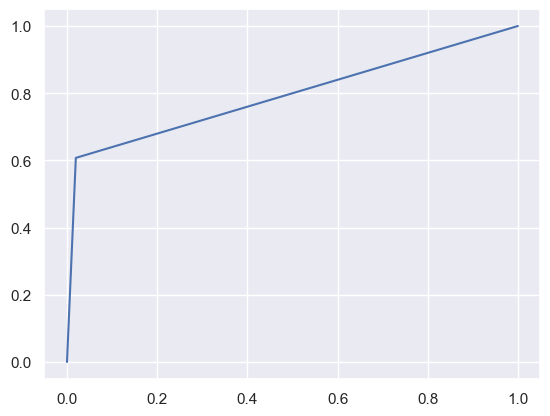

(0.9416666666666667, 0.782172373081464, 0.7939558216684197)

In [72]:
#Applying the random forest classifer :
rf=RandomForestClassifier(random_state=42,max_depth=5)
rf.fit(X_train,y_train)
y_pred=rf.predict(X_test)
score=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
fpr,tpr,threshold=roc_curve(y_test,y_pred)
score_auc=auc(fpr,tpr)
f1=f1_score(y_test,y_pred)
plt.plot(fpr,tpr)
plt.show()
score,precision,score_auc


In [73]:
f1

0.6838709677419355

In [57]:
#Extracting the feature importances into a dataframe:
feature_dict=[]
for i in range(len(rf.feature_names_in_)):
    feature_dict.append((rf.feature_names_in_[i],rf.feature_importances_[i]))
feature_importance=pd.DataFrame(feature_dict,columns=['feature','importance']).sort_values(by='importance',ascending=False)
feature_importance

,feature,importance
118,total_ic_mou_8,0.1340
1,loc_ic_mou_8,0.1140
121,total_og_mou_8,0.1103
11,loc_og_mou_8,0.0835
13,loc_ic_t2m_mou_8,0.0705
124,arpu_8,0.0482
0,loc_ic_t2t_mou_8,0.0467
113,total_rech_amt_8,0.0438
21,offnet_mou_8,0.0263
72,loc_ic_mou_7,0.0219


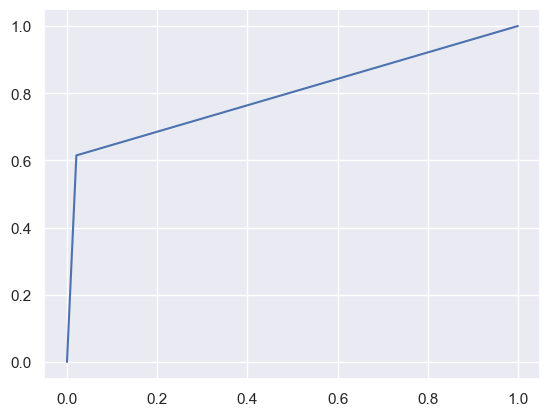

0.9413809523809524 0.7742494226327945 0.7970393482018269


In [58]:
#Applying Decision Tree Classifier:
dt=DecisionTreeClassifier(random_state=42,max_depth=4)
dt.fit(X_train,y_train)
y_pred=dt.predict(X_test)
score=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
fpr,tpr,threshold=roc_curve(y_test,y_pred)
score_auc=auc(fpr,tpr)
plt.plot(fpr,tpr)
plt.show()
print(score,precision,score_auc)


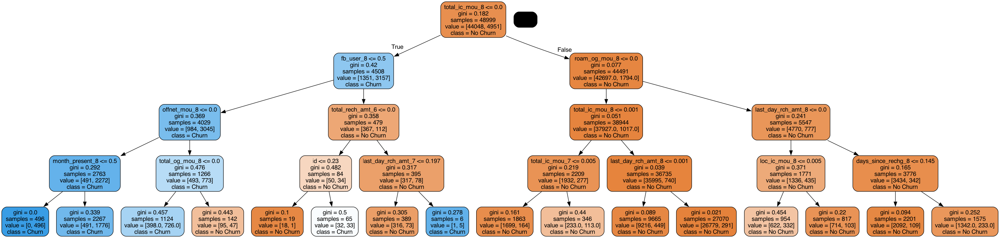

In [59]:
#Visualizing the decision tree graph:
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus,graphviz


dot_data=StringIO()
export_graphviz(dt,out_file=dot_data,filled=True,rounded=True,feature_names=X.columns,
                class_names=['No Churn','Churn'])
graph=pydotplus.graph_from_dot_data(dot_data.getvalue())

Image(graph.create_png())



In [60]:
#Extracting the feature importances into a dataframe:
feature_dict_dt=[]
for i in range(len(dt.feature_names_in_)):
    feature_dict_dt.append((dt.feature_names_in_[i],dt.feature_importances_[i]))
feature_importance_dt=pd.DataFrame(feature_dict_dt,columns=['feature','importance']).sort_values(by='importance',ascending=False)
Important_Features_dt=list(feature_importance_dt[feature_importance_dt['importance']>0].feature)

In [61]:
Important_Features_dt

['total_ic_mou_8',
 'fb_user_8',
 'roam_og_mou_8',
 'offnet_mou_8',
 'last_day_rch_amt_8',
 'loc_ic_mou_8',
 'month_present_8',
 'total_ic_mou_7',
 'total_og_mou_8',
 'days_since_rechg_8',
 'id',
 'total_rech_amt_6',
 'last_day_rch_amt_7']

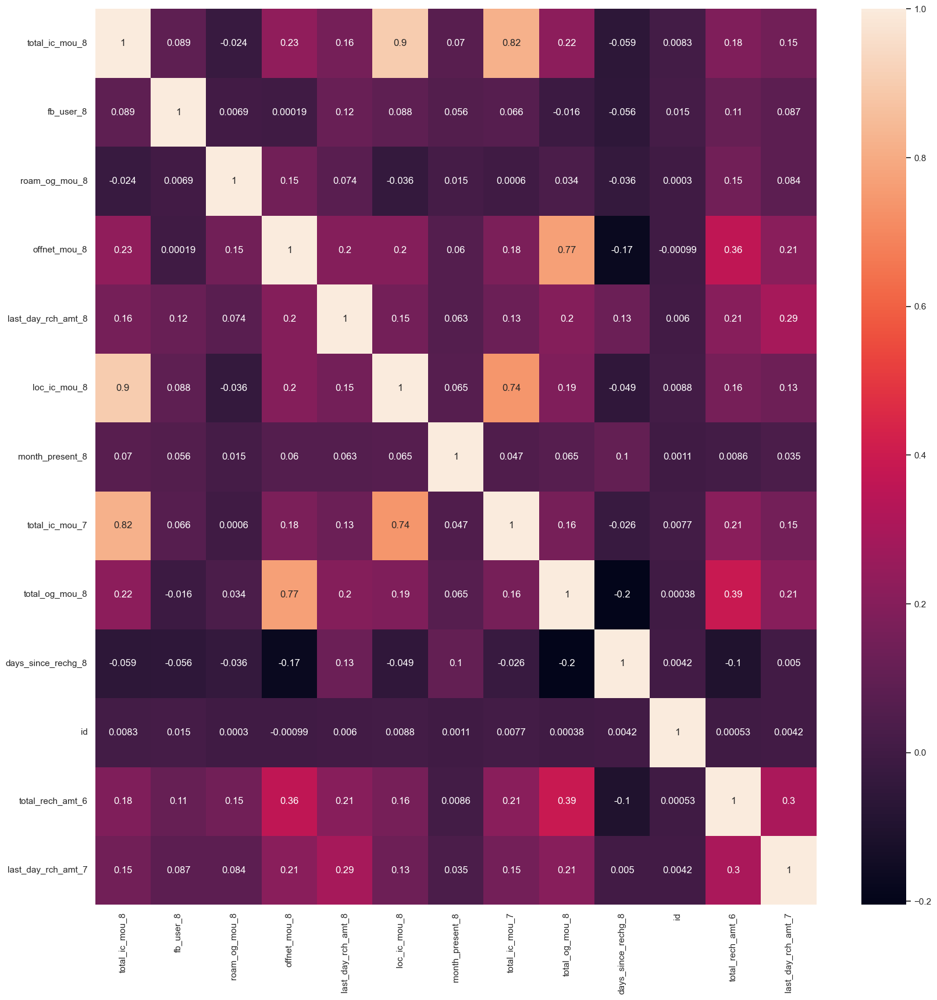

In [62]:
plt.figure(figsize=(20,20))
X_imp=X_train[Important_Features_dt]
sns.heatmap(X_imp.corr(),annot=True)
plt.show()

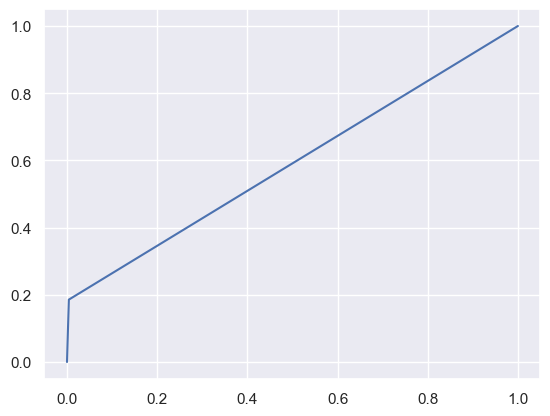

0.9117142857142857 0.8385093167701864 0.5907749440792408


In [63]:
# Applying Logistic Regression Clssifier:
lgm=LogisticRegression()
lgm.fit(X_train,y_train)
y_pred=lgm.predict(X_test)
score=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
fpr,tpr,threshold=roc_curve(y_test,y_pred)
plt.plot(fpr,tpr)
score_auc=auc(fpr,tpr)
plt.show()
print(score,precision,score_auc)

In [64]:
#Applying Logistic Regression using statsmodel in order to interpret better and find robust features:
import statsmodels.api as sm
from sklearn.feature_selection import RFE
lr=LogisticRegression()
rfe=RFE(lr,n_features_to_select=30)
rfe.fit(X_train,y_train)
list(zip(X_train.columns, rfe.support_, rfe.ranking_))
col = X_train.columns[rfe.support_]
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                48999
Model:                            GLM   Df Residuals:                    48968
Model Family:                Binomial   Df Model:                           30
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -10120.
Date:                Thu, 28 Mar 2024   Deviance:                       20240.
Time:                        16:07:28   Pearson chi2:                 2.22e+08
No. Iterations:                    26   Pseudo R-squ. (CS):             0.2147
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 60.3509   3.66e+04      0.002      0.999   -7.16e+04    7.17e+04
loc_ic_t2t_mou_8    1.065e+06   4.17e+04     25.543      0.000    9.83e+05    1.15e+06
loc_ic_mou_8       -1.078e+06   4.22e+04    -25.544      0.000   -1.16e+06   -9.96e+05
loc_og_t2m_mou_8      -7.6525      5.276     -1.451      0.147     -17.993       2.688
loc_og_t2f_mou_8       1.3666      2.491      0.549      0.583      -3.516       6.250
loc_ic_t2f_mou_8    1.669e+05   6535.519     25.539      0.000    1.54e+05     1.8e+05
loc_og_mou_8         -18.8863      8.105     -2.330      0.020     -34.772      -3.001
loc_ic_t2m_mou_8    6.246e+05   2.45e+04     25.541      0.000    5.77e+05    6.73e+05
std_ic_mou_8         -17.2582      3.399     -5.078      0.000     -23.920     -10.597
roam_og_mou_8        -18.4726     22.438     -0.823      0.410     -62.450      25.504
roam_ic_mou_8          2.0777      1.153      1.802      0.072      -0.182       4.337
spl_ic_mou_8        -120.3981      8.789    -13.698      0.000    -137.625    -103.172
offnet_mou_8          70.7399     58.659      1.206      0.228     -44.229     185.709
onnet_mou_8           53.4729     45.052      1.187      0.235     -34.828     141.774
std_og_mou_6           0.6629      0.611      1.086      0.278      -0.534       1.860
roam_og_mou_7          3.4879      0.930      3.749      0.000       1.665       5.311
std_og_mou_7           3.2521      0.722      4.507      0.000       1.838       4.666
loc_ic_t2m_mou_7       7.4480      1.144      6.513      0.000       5.207       9.689
monthly_2g_8          -5.1046      0.658     -7.758      0.000      -6.394      -3.815
total_rech_num_8      -8.3263      0.846     -9.837      0.000      -9.985      -6.667
total_rech_num_6       3.0422      0.587      5.184      0.000       1.892       4.192
total_ic_mou_8         6.5090      3.309      1.967      0.049       0.023      12.995
total_og_mou_8       -76.8610     58.766     -1.308      0.191    -192.041      38.319
count_rech_2g_8        5.3550      3.019      1.774      0.076      -0.562      11.272
total_rech_data_8    -20.9832      3.643     -5.760      0.000     -28.123     -13.843
last_day_rch_amt_8   -24.0109      1.881    -12.763      0.000     -27.698     -20.323
max_rech_amt_8         0.4438      1.141      0.389      0.697      -1.793       2.680
month_present_7      -26.5854   2.86e+04     -0.001      0.999   -5.61e+04     5.6e+04
month_present_8      -26.6557   2.28e+04     -0.001      0.999   -4.46e+04    4.46e+04
difference_7_to_8     -2.8107      2.030     -1.384      0.166      -6.790       1.169
arpu_6_to_8          -14.2390      2.778     -5.125      0.000     -19.685      -8.793
======================================================================================
"""

In [65]:
#Checking VIF for the above model:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = X_train_sm.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,loc_ic_mou_8,1545826071.0000
7,loc_ic_t2m_mou_8,687487707.0300
1,loc_ic_t2t_mou_8,494676741.0800
5,loc_ic_t2f_mou_8,36941188.9700
0,const,3992.3300
22,total_og_mou_8,3371.3600
12,offnet_mou_8,1458.1800
13,onnet_mou_8,1427.9800
9,roam_og_mou_8,59.5300
21,total_ic_mou_8,19.9400


In [66]:
X_train_sm2=X_train_sm.drop(['loc_ic_t2m_mou_8','roam_ic_mou_8','total_og_mou_8','loc_ic_t2f_mou_8','month_present_8','total_ic_mou_8'
                           ,'loc_og_mou_8','count_rech_2g_8' ,'month_present_7','offnet_mou_8'],axis=1)

In [67]:
logm3 = sm.GLM(y_train,X_train_sm2, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                48999
Model:                            GLM   Df Residuals:                    48978
Model Family:                Binomial   Df Model:                           20
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -10954.
Date:                Thu, 28 Mar 2024   Deviance:                       21908.
Time:                        16:07:34   Pearson chi2:                 3.41e+12
No. Iterations:                     9   Pseudo R-squ. (CS):             0.1875
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  8.5577      1.314      6.514      0.000       5.983      11.133
loc_ic_t2t_mou_8      98.9991     13.097      7.559      0.000      73.329     124.669
loc_ic_mou_8        -177.7229      7.626    -23.305      0.000    -192.670    -162.776
loc_og_t2m_mou_8     -24.6651      3.234     -7.627      0.000     -31.004     -18.326
loc_og_t2f_mou_8      -6.5014      2.949     -2.204      0.027     -12.282      -0.721
std_ic_mou_8         -18.4799      2.976     -6.209      0.000     -24.313     -12.647
roam_og_mou_8         12.7461      1.538      8.287      0.000       9.731      15.761
spl_ic_mou_8        -127.6793      8.953    -14.261      0.000    -145.227    -110.132
onnet_mou_8           -5.0063      1.410     -3.550      0.000      -7.770      -2.242
std_og_mou_6          -0.1922      0.591     -0.325      0.745      -1.351       0.966
roam_og_mou_7          3.8536      0.920      4.190      0.000       2.051       5.656
std_og_mou_7           3.2724      0.641      5.108      0.000       2.017       4.528
loc_ic_t2m_mou_7       8.7243      1.313      6.647      0.000       6.152      11.297
monthly_2g_8          -4.9521      0.646     -7.661      0.000      -6.219      -3.685
total_rech_num_8     -12.5615      0.853    -14.725      0.000     -14.234     -10.890
total_rech_num_6       2.6945      0.580      4.642      0.000       1.557       3.832
total_rech_data_8    -15.1494      1.549     -9.778      0.000     -18.186     -12.113
last_day_rch_amt_8   -24.8265      1.869    -13.283      0.000     -28.490     -21.163
max_rech_amt_8        -3.7985      1.194     -3.182      0.001      -6.138      -1.459
difference_7_to_8      1.8242      2.042      0.894      0.372      -2.177       5.826
arpu_6_to_8          -21.1000      2.735     -7.714      0.000     -26.461     -15.739
======================================================================================
"""

In [68]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = X_train_sm2.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm2.values, i) for i in range(X_train_sm2.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,3321.3800
2,loc_ic_mou_8,5.5500
11,std_og_mou_7,3.2800
9,std_og_mou_6,2.9900
1,loc_ic_t2t_mou_8,2.9800
12,loc_ic_t2m_mou_7,2.6900
14,total_rech_num_8,2.5200
20,arpu_6_to_8,2.3500
18,max_rech_amt_8,2.2400
15,total_rech_num_6,2.1400


In [69]:
important_features_stats_model=list(vif.Features)
important_features_stats_model

['const',
 'loc_ic_mou_8',
 'std_og_mou_7',
 'std_og_mou_6',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2m_mou_7',
 'total_rech_num_8',
 'arpu_6_to_8',
 'max_rech_amt_8',
 'total_rech_num_6',
 'last_day_rch_amt_8',
 'difference_7_to_8',
 'onnet_mou_8',
 'roam_og_mou_8',
 'roam_og_mou_7',
 'loc_og_t2m_mou_8',
 'total_rech_data_8',
 'loc_og_t2f_mou_8',
 'monthly_2g_8',
 'std_ic_mou_8',
 'spl_ic_mou_8']